In [51]:
### Imports

# Plotting imports
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patheffects as path_effects
import matplotlib.cm as cm
from matplotlib.colors import Normalize, ListedColormap
from matplotlib.ticker import AutoMinorLocator
import matplotlib.ticker as ticker
from matplotlib import ticker as mticker
from matplotlib.lines import Line2D
from matplotlib.dates import MonthLocator, YearLocator, DateFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns

# Machine learning imports
from sklearn import preprocessing
from sklearn.svm import SVR, SVC
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression, Ridge, Lasso, RidgeCV, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, BaggingRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder

# Misc
from dateutil.relativedelta import relativedelta
import numpy as np
import pandas as pd
import datetime as dt
import requests
import calendar
import pickle
import time

In [52]:
### Constants

# The user that the stats will be built for
masterUser = 'Jamie'

# Plotting
legendColor = 'w'
backgroundColor = '#292929' # Dark grey
hotColdColors = np.array(['tab:blue', 'w', 'tab:red'])
difficultyColors = np.array(['limegreen', 'yellow', 'darkorange', 'red']) # Easy, Medium, Hard, Very hard
standardCanvasHeight = 8
standardCanvasWidth = 16
legendTextSize = 16
axisLabelSize = 26
tickLabelSize = 16
titleSize = 32
DPI = 360 # dots per inch (resolution)

# Misc
dateFormat = '%Y-%m-%d'
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
completedTrailsPath = 'dataSources/MyTrails.csv'
shortlistTrailsPath = 'dataSources/Shortlist.csv'

<b><font size="3">Setting Up Data</font></b>

In [53]:
"""
Gets climate data via open-meteo API and saves.
Climate data is based on the weather data of the past 10 years relative to trail end_date.
USA National Park trails had their climate date range from 2011-01-01 to 2020-12-31.

summerTemp (C): 0.98 quantile of daily max temps, a normal hot summer day
winterTemp (C): 0.02 quantile of daily min temps, a normal cold winter night
annualRain (mm): Average rain per year
annualSnow (cm): Average snow per year
"""
def addClimateDataAndSave(trails, outputCSV, forceOverwrite=False):

    summerTemp = trails['summer_temp'].copy()
    winterTemp = trails['winter_temp'].copy()
    annualRain = trails['annual_rain'].copy()
    annualSnow = trails['annual_snow'].copy()
    
    # Getting climate data one trail at a time
    for i, trail in enumerate(trails.itertuples(index=False)):

        if (np.isnan(trail.summer_temp) or np.isnan(trail.winter_temp)
            or np.isnan(trail.annual_rain) or np.isnan(trail.annual_snow)
            or forceOverwrite):
            
            climateRangeEndDate = trail.end_date
            if pd.isna(climateRangeEndDate):
                print(climateRangeEndDate)
                climateRangeEndDate = dt.date.today() - dt.timedelta(days=2)
                
            climateRangeEndDateStr = climateRangeEndDate.strftime(dateFormat)
            climateRangeStartDateStr = (climateRangeEndDate - relativedelta(years=10)).strftime(dateFormat)
            
            time.sleep(10) # To get around request rate limit
            response = requests.get('https://archive-api.open-meteo.com/v1/archive?' 
                                    + f'latitude={trail.lat}&longitude={trail.lng}&start_date' 
                                    + f'={climateRangeStartDateStr}&end_date={climateRangeEndDateStr}&daily='
                                    + 'temperature_2m_max,temperature_2m_min,rain_sum,snowfall_sum&timezone=auto')
            
            try:
                responseDaily = response.json()['daily']
            except:
                print(response.json()['reason'])
                break

            summerTemp[i] = np.quantile(responseDaily['temperature_2m_max'], 0.98) # 2% of days are hotter
            winterTemp[i] = np.quantile(responseDaily['temperature_2m_min'], 0.02) # 2% of days are colder
            annualRain[i] = np.sum(responseDaily['rain_sum'])/10 # average over 10 years
            annualSnow[i] = np.sum(responseDaily['snowfall_sum'])/10 # average over 10 years
    
        # Progress notifications
        if (i+1)%10 == 0:
            print(f'Climate data obtained for {i+1} trails')
            
    trails['summer_temp'] = pd.Series(summerTemp)
    trails['winter_temp'] = pd.Series(winterTemp)
    trails['annual_rain'] = pd.Series(annualRain)
    trails['annual_snow'] = pd.Series(annualSnow)

    trails.to_csv(outputCSV, index=False)
    print('########## DONE FETCHING CLIMATE DATA ###########\n')

    return trails

"""
Gets weather data via API and saves.
For overnight trails, the hike is assumed to start and end at noon.
For day trails, the hike is assumed to be a 4 hour midday hike.

maxTemp (C): Maximum temperature
minTemp (C): Minimum temperature
rain (mm): Total rain
snow (cm): Total snow
"""
def addWeatherDataAndSave(trails, outputCSV, forceOverwrite=False):
        
    maxTemp = trails['max_temp'].copy()
    minTemp = trails['min_temp'].copy()
    rain = trails['rain'].copy()
    snow = trails['snow'].copy()
    
    # Getting weather data one trail at a time
    for i, trail in enumerate(trails.itertuples(index=False)):
                
        if (np.isnan(trail.max_temp) or np.isnan(trail.min_temp) 
            or np.isnan(trail.rain) or np.isnan(trail.snow) 
            or forceOverwrite):
                        
            time.sleep(60/600) # Limited to 600 requests per minute
            response = requests.get('https://archive-api.open-meteo.com/v1/archive?' 
                                    + f'latitude={trail.lat}&longitude={trail.lng}&' 
                                    + f'start_date={trail.start_date}&end_date={trail.end_date}' 
                                    + '&hourly=temperature_2m,rain,snowfall&timezone=America%2FNew_York')
            
            try:
                responseHourly = response.json()['hourly']
            except:
                print(response.json()['reason'])
                break

            numNights = (trail.end_date - trail.start_date).days
            if numNights > 0: # Overnight hikes are backpacking hikes
                hourOffset = 12 # Assume backpacking hikes start and end at noon
            else:
                hourOffset = 10 # Assume day hikes are 4 hour hikes at mid day
                
            maxTemp[i] = np.max(responseHourly['temperature_2m'][hourOffset:-hourOffset]) # max over period
            minTemp[i] = np.min(responseHourly['temperature_2m'][hourOffset:-hourOffset]) # min over period
            rain[i] = np.sum(responseHourly['rain'][hourOffset:-hourOffset])
            snow[i] = np.sum(responseHourly['snowfall'][hourOffset:-hourOffset])
        
        # Progress notifications 
        if (i+1)%10 == 0:
            print(f'Weather data obtained for {i+1} trails')
    
    trails['max_temp'] = maxTemp
    trails['min_temp'] = minTemp
    trails['rain'] = rain
    trails['snow'] = snow
    
    trails.to_csv(outputCSV, index=False)
    print('########## DONE FETCHING WEATHER DATA ###########\n')
    
    return trails
    
def importTrails(trailPath):

    trails = pd.read_csv(trailPath, parse_dates=['start_date', 'end_date'], engine='python')
    
    trails['start_date'] = trails.start_date.dt.date
    trails['end_date'] = trails.end_date.dt.date
    
    trails = addClimateDataAndSave(trails, trailPath, forceOverwrite=False)

    if trails['start_date'].notna().any():
        trails['backpacking'] = (trails['days'] > 1).astype(int)
    else:
        trails['backpacking'] = 1
    
    trails['num_reviews'] = 1 # just me :D

    return trails

############################################################

completedTrails = importTrails(completedTrailsPath)

originalColumns = completedTrails.columns

completedTrails = completedTrails.sort_values(['user', 'start_date'])
completedTrails['order'] = completedTrails[completedTrails.user.notna() & (completedTrails.user != '')].groupby('user').cumcount() + 1

completedTrails['nights'] = (pd.to_datetime(completedTrails.end_date) - pd.to_datetime(completedTrails.start_date)).dt.days
completedTrails['days'] = completedTrails.nights + 1

completedTrails['avg_temp'] = (completedTrails.min_temp + completedTrails.max_temp)/2
completedTrails['solo'] = completedTrails.num_people == 1

completedTrails['dist_per_day'] = completedTrails.distance.divide(completedTrails.days)
completedTrails['gain_per_day'] = completedTrails.elevation_gain.divide(completedTrails.days)
completedTrails['rain_per_day'] = completedTrails.rain.divide(completedTrails.days)
completedTrails['snow_per_day'] = completedTrails.snow.divide(completedTrails.days)

companionInstances = completedTrails.query('user == @masterUser').companions.dropna().str.split(', ').explode()
companions = sorted([companion for companion in companionInstances.unique() if companion != ''])
for companion in companions:
    completedTrails[companion] = completedTrails.companions.fillna('').str.contains(companion).astype('int')

completedTrails['companions'] = completedTrails.companions.fillna('')

completedTrails = addWeatherDataAndSave(completedTrails, completedTrailsPath, forceOverwrite=False)

############################################################

shortlistTrails = importTrails(shortlistTrailsPath)

shortlistTrails['user'] = masterUser

############################################################

myCompletedTrails = completedTrails.query('user == @masterUser')
mySoloTrails = myCompletedTrails.query('num_people == 1')
myGroupTrails = myCompletedTrails.query('num_people > 1')

Climate data obtained for 10 trails
Climate data obtained for 20 trails
Climate data obtained for 30 trails
Climate data obtained for 40 trails
Climate data obtained for 50 trails
########## DONE FETCHING CLIMATE DATA ###########

Weather data obtained for 10 trails
Weather data obtained for 20 trails
Weather data obtained for 30 trails
Weather data obtained for 40 trails
Weather data obtained for 50 trails
########## DONE FETCHING WEATHER DATA ###########

Climate data obtained for 10 trails
########## DONE FETCHING CLIMATE DATA ###########



In [54]:
### Setting Up My Personal Dataset

completedTrails['avg_temp'] = (completedTrails.min_temp + completedTrails.max_temp)/2
completedTrails['solo'] = completedTrails.num_people == 1

companionInstances = completedTrails.query('user == @masterUser').companions.dropna().str.split(', ').explode()
companions = sorted([companion for companion in companionInstances.unique() if companion != ''])
for companion in companions:
    completedTrails[companion] = completedTrails.companions.fillna('').str.contains(companion).astype('int')

completedTrails['companions'] = completedTrails.companions.fillna('')

completedTrails['dist_per_day'] = completedTrails.distance.divide(completedTrails.days)
completedTrails['gain_per_day'] = completedTrails.elevation_gain.divide(completedTrails.days)
completedTrails['rain_per_day'] = completedTrails.rain.divide(completedTrails.days)
completedTrails['snow_per_day'] = completedTrails.snow.divide(completedTrails.days)

myCompletedTrails = completedTrails.query('user == @masterUser')
mySoloTrails = myCompletedTrails.query('num_people == 1')
myGroupTrails = myCompletedTrails.query('num_people > 1')

In [55]:
### Setting Up USA National Park Trails

# USA National Park Trails from AllTrails - https://github.com/j-ane/trail-data/tree/master
usaTrails = pd.read_csv('dataSources/AllTrailsUsaNationalParks.csv', engine='python', encoding='latin1')

# Renaming columns
usaTrails = usaTrails.rename(columns={'length': 'distance',
                                      'difficulty_rating':'difficulty',
                                      'avg_rating':'rating',
                                      'area_name':'park',
                                      'city_name':'region',
                                      'state_name':'province',
                                      'country_name':'country'})

# Adding/modifying columns
usaTrails['lat'] = usaTrails.apply(lambda trail: trail._geoloc.split(': ', 2)[1][:-7], axis=1)
usaTrails['lng'] = usaTrails.apply(lambda trail: trail._geoloc.split(': ', 2)[2][:-1], axis=1)

usaTrails['forest'] = usaTrails.features.str.contains('forest').astype(int)
usaTrails['lake'] = usaTrails.features.str.contains('lake').astype(int)
usaTrails['river'] = usaTrails.features.str.contains('river').astype(int)
usaTrails['waterfall'] = usaTrails.features.str.contains('waterfall').astype(int)
usaTrails['beach'] = usaTrails.features.str.contains('beach').astype(int)
usaTrails['historic_site'] = usaTrails.features.str.contains('historic-site').astype(int)
usaTrails['cave'] = usaTrails.features.str.contains('cave').astype(int)
usaTrails['hot_spring'] = usaTrails.features.str.contains('hot-springs').astype(int)
usaTrails['backpacking'] = usaTrails.activities.str.contains('backpacking').astype(int)

usaTrails['user'] = 'Unknown'
usaTrails['country'] = 'USA'
usaTrails.loc[usaTrails['province'] == 'Maui', 'province'] = 'Hawaii' # Maui is part of Hawaii
usaTrails['region'] = usaTrails['region'].str.replace(' National Park', '') # Trimming park names
usaTrails['park'] = usaTrails['park'].str.replace(' National Park', '') # Trimming park names
usaTrails['route_source'] = 'alltrails'
usaTrails['distance'] = usaTrails['distance']/1000.0 # m to km

# Filtering out non-hiking trails and outliers
noDriving = ~usaTrails.activities.str.contains('driving')
noPaddle = ~usaTrails.name.str.contains('Paddle')
usaTrails = usaTrails.query('@noDriving & @noPaddle & distance > 0.1 & num_reviews > 0 & elevation_gain > 1 & distance > 0.1')

# Removing unneeded columns
usaTrails = usaTrails.drop(['trail_id',
                            'popularity',
                            'visitor_usage',
                            'units',
                            '_geoloc',
                            'features',
                            'activities'], axis=1)

trainingTrails = pd.concat([usaTrails, completedTrails]) # Used to train/test difficulty/enjoyment models

<b><font size="3">Statistics and Visualizations</font></b>

In [56]:
### Stats for My Personal Dataset

"""
Determines if there is a tie for a trail record.
Constructs string for printing.
"""
def tieValidator(recordTrails, fullLocation=True):
    recordNames = recordTrails.name.values
    
    if len(recordNames) == 1:
        if fullLocation == False:
            return recordNames[0]
        
        else:
            return (f'{recordTrails.name.values[0]}, {recordTrails.park.values[0]}, ' 
                    + f'{recordTrails.province.values[0]}, {recordTrails.country.values[0]}')
        
    else:
        if fullLocation == False:
            return f'{len(recordNames)} way tie'
        
        else:
            return (f'{len(recordNames)} way tie, {recordTrails.park.values[0]}, '
                    + f'{recordTrails.province.values[0]}, {recordTrails.country.values[0]}')

"""
Determines the min/max of a trail feature.
findMax = True -> Finds the max | findMax = False -> Finds the min.
perColumn = X -> determines the min/max PER X (eg: distance PER day).
"""
def printTrailRecord(trails, recordName, column, units, findMax=True, perColumn=None, perColumnUnits=None):
    if perColumn == None:
        if findMax == True:
            recordCondition = trails[column] == trails[column].max()
            
        else:
            recordCondition = trails[column] == trails[column].min()
            
        recordTrails = trails.query('@recordCondition')
        return print(f'{recordName}: {round(recordTrails[column].values[0], 1)} {units} ({tieValidator(recordTrails)})')
    
    else:
        if findMax == True:
            recordCondition = trails[column]/(trails[perColumn]) == (trails[column]/(trails[perColumn])).max()
            
        else:
            recordCondition = trails[column]/(trails[perColumn]) == (trails[column]/(trails[perColumn])).min()
            
        recordTrails = trails.query('@recordCondition')
        return print(f'{recordName}: {round(recordTrails[column].values[0]/(recordTrails[perColumn].values[0]), 1)}'
                     + f' {units}/{perColumnUnits} ({tieValidator(recordTrails)})')

print('########## MY BACKPACKING TRAILS ##########')
print('\n')

print('---------- TOTALS ----------')

numCompletedTrails = len(myCompletedTrails)
print(f'Number of Trails: {numCompletedTrails}')

backpackingDist = myCompletedTrails.distance.sum()
print(f'Distance: {round(backpackingDist, 0)} km ({round(backpackingDist/40075.0, 3)} Earth circumnavigations, ' 
      + f'{round(backpackingDist/42.195, 1)} marathons, {round(backpackingDist/0.4)} running track laps)')

backpackingGain = myCompletedTrails.elevation_gain.sum()
print(f'Elevation Gain: {round(backpackingGain/1000, 1)} km ({round(backpackingGain/(3480.816), 1)} Mt. Everests, '
      + f'{round(backpackingGain/346, 1)} CN Towers, {round(backpackingGain/1.8415)} Jamies)')

print(f'Number of Days: {round(myCompletedTrails.days.sum())}')
print(f'Number of Nights: {round(myCompletedTrails.nights.sum())}')

totalRain = myCompletedTrails.rain.sum()
print(f'Rain: {round(totalRain, 1)} mm ({round(totalRain/123, 1)} cans of pop)')

totalSnow = myCompletedTrails.snow.sum()
print(f'Snow: {round(totalSnow, 2)} cm ({round(totalSnow/12.3, 2)} cans of pop)')
print('\n')


print('---------- AVERAGES (BY TRAIL) ----------')
print(f'Average Distance: {round(myCompletedTrails.distance.mean(), 1)} km')
print(f'Average Elevation Gain: {round(myCompletedTrails.elevation_gain.mean())} m')
print(f'Average Number of Days: {round(myCompletedTrails.days.mean(), 1)} days')
print('\n')

print('---------- AVERAGES (BY DAY) ----------')
print(f'Average Distance: {round(myCompletedTrails.distance.sum()/myCompletedTrails.days.sum(), 1)} km '
      + f'(Solo: {round(mySoloTrails.distance.sum()/mySoloTrails.days.sum(), 1)} km, '
      + f'Group: {round(myGroupTrails.distance.sum()/myGroupTrails.days.sum(), 1)} km)')

print(f'Average Elevation Gain: {round(myCompletedTrails.elevation_gain.sum()/myCompletedTrails.days.sum())} m ' 
      + f'(Solo: {round(mySoloTrails.elevation_gain.sum()/mySoloTrails.days.sum())} m, ' 
      + f'Group: {round(myGroupTrails.elevation_gain.sum()/myGroupTrails.days.sum())} m)')
print('\n')

print('---------- RECORDS ----------')
printTrailRecord(myCompletedTrails, 'Most Distance', 'distance', 'km')
printTrailRecord(myCompletedTrails, 'Most Distance per Day', 'distance', 'km', perColumn='days', perColumnUnits='day')
printTrailRecord(myCompletedTrails, 'Most Elevation Gain', 'elevation_gain', 'm')
printTrailRecord(myCompletedTrails, 'Most Elevation Gain per Day', 'elevation_gain', 'm', perColumn='days', perColumnUnits='day')
printTrailRecord(myCompletedTrails, 'Most Days', 'days', 'days')
printTrailRecord(myCompletedTrails, 'Hottest Temperature', 'max_temp', '°C')
printTrailRecord(myCompletedTrails, 'Coldest Temperature', 'min_temp', '°C', findMax=False)
printTrailRecord(myCompletedTrails, 'Most Rain', 'rain', 'mm')
printTrailRecord(myCompletedTrails, 'Most Snow', 'snow', 'cm')

print(f'Most Common Country: {myCompletedTrails.country.mode()[0]} ' 
      + f'({round(myCompletedTrails.country.value_counts().iloc[0]/numCompletedTrails, 3)} of trails)')

print(f'Most Common Province: {myCompletedTrails.province.mode()[0]} ' 
      + f'({round(myCompletedTrails.province.value_counts().iloc[0]/numCompletedTrails, 3)} of trails)')

print(f'Most Common Park: {myCompletedTrails.park.mode()[0]} ' 
      + f'({round(myCompletedTrails.park.value_counts().iloc[0]/numCompletedTrails, 3)} of trails)')

myBackpackingCompanionInstances = myCompletedTrails[myCompletedTrails.companions != ''].companions.dropna().str.split(', ').explode()
myBackpackingCompanions = sorted([companion for companion in myBackpackingCompanionInstances.unique() if companion != ''])
myMostCommonBackpackingCompanions = myBackpackingCompanionInstances.mode()
print((f'Most Common Companion: {", ".join(myMostCommonBackpackingCompanions)} '
       + f'({myBackpackingCompanionInstances.tolist().count(myMostCommonBackpackingCompanions[0])} trails)'))
print('\n')


print('---------- RATES ----------')
print(f'Solo Rate: {round(len(mySoloTrails)/numCompletedTrails, 3)}')
print(f'Forest Rate: {round(myCompletedTrails.forest.mean(), 3)}')
print(f'Lake Rate: {round(myCompletedTrails.lake.mean(), 3)}')
print(f'River Rate: {round(myCompletedTrails.river.mean(), 3)}')
print(f'Waterfall Rate: {round(myCompletedTrails.waterfall.mean(), 3)}')
print(f'Beach Rate: {round(myCompletedTrails.beach.mean(), 3)}')
print(f'Historic Site Rate: {round(myCompletedTrails.historic_site.mean(), 3)}')
print(f'Cave Rate: {round(myCompletedTrails.cave.mean(), 3)}')
print(f'Hot Spring Rate: {round(myCompletedTrails.hot_spring.mean(), 3)}')
print('\n')


print('########## FULL DATASET STATISTICS ##########')
print('\n')

print('---------- TOTALS ----------')
numTrainingTrails = len(trainingTrails)
print(f'Number of Trails: {numTrainingTrails}')
print('\n')


print('---------- AVERAGES (BY TRAIL) ----------')
print(f'Average Distance: {round(trainingTrails.distance.mean(), 1)} km')
print(f'Average Elevation Gain: {round(trainingTrails.elevation_gain.mean())} m')
print('\n')


print('---------- RECORDS ----------')
printTrailRecord(trainingTrails, 'Most Distance', 'distance', 'km')
printTrailRecord(trainingTrails, 'Most Elevation Gain', 'elevation_gain', 'm')
printTrailRecord(trainingTrails, 'Hottest Summer', 'summer_temp', '°C')
printTrailRecord(trainingTrails, 'Coldest Winter', 'winter_temp', '°C', findMax=False)
printTrailRecord(trainingTrails, 'Most Annual Rain', 'annual_rain', 'mm')
printTrailRecord(trainingTrails, 'Most Annual Snow', 'annual_snow', 'cm')
printTrailRecord(trainingTrails, 'Most Popular', 'num_reviews', 'reviews')

print(f'Most Common Country: {trainingTrails.country.mode()[0]} ' 
      + f'({round(trainingTrails.country.value_counts().iloc[0]/numTrainingTrails, 3)} of trails)')

print(f'Most Common Province: {trainingTrails.province.mode()[0]} ' 
      + f'({round(trainingTrails.province.value_counts().iloc[0]/numTrainingTrails, 3)} of trails)')

print(f'Most Common Park: {trainingTrails.park.mode()[0]} ' 
      + f'({round(trainingTrails.park.value_counts().iloc[0]/numTrainingTrails, 3)} of trails)')
print('\n')


print('---------- RATES ----------')
print(f'Forest Rate: {round(trainingTrails.forest.mean(), 3)}')
print(f'Lake Rate: {round(trainingTrails.lake.mean(), 3)}')
print(f'River Rate: {round(trainingTrails.river.mean(), 3)}')
print(f'Waterfall Rate: {round(trainingTrails.waterfall.mean(), 3)}')
print(f'Beach Rate: {round(trainingTrails.beach.mean(), 3)}')
print(f'Historic Site Rate: {round(trainingTrails.historic_site.mean(), 3)}')
print(f'Cave Rate: {round(trainingTrails.cave.mean(), 3)}')
print(f'Hot Spring Rate: {round(trainingTrails.hot_spring.mean(), 3)}')


########## MY BACKPACKING TRAILS ##########


---------- TOTALS ----------
Number of Trails: 48
Distance: 1294.0 km (0.032 Earth circumnavigations, 30.7 marathons, 3236 running track laps)
Elevation Gain: 25.6 km (7.4 Mt. Everests, 74.0 CN Towers, 13896 Jamies)
Number of Days: 123
Number of Nights: 75
Rain: 211.4 mm (1.7 cans of pop)
Snow: 28.4 cm (2.31 cans of pop)


---------- AVERAGES (BY TRAIL) ----------
Average Distance: 27.0 km
Average Elevation Gain: 533 m
Average Number of Days: 2.6 days


---------- AVERAGES (BY DAY) ----------
Average Distance: 10.5 km (Solo: 12.6 km, Group: 7.9 km)
Average Elevation Gain: 208 m (Solo: 269 m, Group: 133 m)


---------- RECORDS ----------
Most Distance: 86.1 km (Laugavegur, Thorsmork, Iceland, Iceland)
Most Distance per Day: 21.5 km/day (Laugavegur, Thorsmork, Iceland, Iceland)
Most Elevation Gain: 2160 m (Laugavegur, Thorsmork, Iceland, Iceland)
Most Elevation Gain per Day: 755.0 m/day (Grand Canyon, Grand Canyon, Arizona, USA)
Most Days: 5 

In [57]:
### Summarizing stats for a specific hiking companion

"""
Prints a person's record (max or min) in a given feature.
"""
def printPersonStat(prefix, units, recordFeature, person, personStats, rankMethod='min', rankAsc=False):  
    
    hikingCompanionsCopy = hikingCompanions.copy()
    
    hikingCompanionsCopy['recordRank'] = (hikingCompanionsCopy[recordFeature]
                                          .rank(method=rankMethod, ascending=rankAsc)
                                          .astype(int))
    
    personRank = hikingCompanionsCopy.query('name == @person').recordRank.values[0]
    
    numPeopleWithRank = hikingCompanionsCopy.recordRank.value_counts()[personRank]
    
    tieMsg = ''
    if numPeopleWithRank > 1:
        tieMsg = f' [{numPeopleWithRank} way tie]'
        
    if units != '':
        units = ' ' + units
        
    print(f'{prefix}: {personStats[recordFeature].values[0]}{units} (Rank: {personRank}/{numHikingCompanions}{tieMsg})')

"""
Prints a summary of my stats while hiking with a person.
"""
def personBackpackingSummary(person):
    print(f"{person}'s hiking summary".upper())
    print(f"with comparisons to {masterUser}'s other backpacking companions (there are {numHikingCompanions})")
    print('\n')
    
    personStats = hikingCompanions.query('name == @person')

    printPersonStat('Number of Trails', '', 'num_trails', person, personStats)
    printPersonStat('Number of Days', '', 'num_days', person, personStats)
    printPersonStat('Number of Nights', '', 'num_nights', person, personStats)
    printPersonStat(f"Correlation with {masterUser}'s Enjoyment", '', 'rating_corr', person, personStats)
    print('\n')

    printPersonStat('Total Distance', 'km', 'distance', person, personStats)
    printPersonStat('Total Elevation Gain', 'm', 'elevation_gain', person, personStats)
    printPersonStat('Distance per Day', 'km/day', 'dist_per_day', person, personStats)
    printPersonStat('Elevation Gain per Day', 'm/day', 'gain_per_day', person, personStats)
    printPersonStat('Days per Trail', 'days/trail', 'days_per_trail', person, personStats)
    print(f'Longest Trail: {personStats.longest_hike.values[0]} ({personStats.longest_hike_dist.values[0]} km)')
    print('\n')

    printPersonStat('Hottest Tempurature', '°C', 'max_temp', person, personStats)
    printPersonStat('Coldest Tempurature', '°C', 'min_temp', person, personStats, rankAsc=True)
    printPersonStat('Total Rain', 'mm', 'rain', person, personStats)
    printPersonStat('Rain/Day', 'mm/day', 'rain_per_day', person, personStats)
    if personStats.snow.values[0] > 0:
        printPersonStat('Total Snow', 'cm', 'snow', person, personStats)
        printPersonStat('Snow/Day', 'cm/day', 'snow_per_day', person, personStats)

hikingCompanions = pd.DataFrame(columns=['name', 'num_trails', 'num_parks', 'num_days', 'num_nights', 
                                         'distance', 'elevation_gain', 'longest_hike', 'longest_hike_dist', 
                                         'max_temp', 'min_temp', 'avg_temp', 'rain', 'snow', 'rating_corr'])

"""
Populating new hikingCompanions dataframe.
One row for each person that has joined me on a backpacking trip.
"""
for i, person in enumerate(myBackpackingCompanions):
          
    personTrails = myCompletedTrails[myCompletedTrails[person] == 1]

    longestTrails = personTrails.query('distance == @personTrails.distance.max()')
          
    enjoymentCorr = myCompletedTrails[person].corr(myCompletedTrails.rating)
            
    hikingCompanions.loc[i] = ([person,
                                len(personTrails),
                                len(personTrails.park.unique()),
                                round(personTrails.days.sum()), 
                                round(personTrails.nights.sum()),
                                round(personTrails.distance.sum(), 1),
                                round(personTrails.elevation_gain.sum(), 1),
                                longestTrails.name.values[0],
                                longestTrails.distance.values[0],
                                personTrails.max_temp.max(),
                                personTrails.min_temp.min(),
                                (personTrails.max_temp.max() + personTrails.max_temp.min())/2,
                                personTrails.rain.sum(),
                                personTrails.snow.sum(),
                                enjoymentCorr])

hikingCompanions['dist_per_day'] = hikingCompanions.distance/hikingCompanions.num_days.astype(float).round()
hikingCompanions['gain_per_day'] = (hikingCompanions.elevation_gain/hikingCompanions.num_days).astype(float).round()
hikingCompanions['days_per_trail'] = hikingCompanions.num_days.astype(float).round()/hikingCompanions.num_trails
hikingCompanions['rain_per_day'] = hikingCompanions.rain/hikingCompanions.num_days.astype(float).round()
hikingCompanions['snow_per_day'] = hikingCompanions.snow/hikingCompanions.num_days.astype(float).round()
hikingCompanions = round(hikingCompanions, 3)
numHikingCompanions = len(hikingCompanions)

personBackpackingSummary('Guy')

GUY'S HIKING SUMMARY
with comparisons to Jamie's other backpacking companions (there are 18)


Number of Trails: 2 (Rank: 3/18 [7 way tie])
Number of Days: 4 (Rank: 8/18 [3 way tie])
Number of Nights: 2 (Rank: 9/18 [5 way tie])
Correlation with Jamie's Enjoyment: 0.102 (Rank: 1/18)


Total Distance: 44.4 km (Rank: 7/18)
Total Elevation Gain: 1700 m (Rank: 3/18)
Distance per Day: 11.1 km/day (Rank: 1/18)
Elevation Gain per Day: 425.0 m/day (Rank: 1/18)
Days per Trail: 2.0 days/trail (Rank: 12/18 [7 way tie])
Longest Trail: Grand Canyon (27.1 km)


Hottest Tempurature: 17.1 °C (Rank: 11/18 [3 way tie])
Coldest Tempurature: 9.0 °C (Rank: 11/18)
Total Rain: 27.9 mm (Rank: 2/18)
Rain/Day: 6.975 mm/day (Rank: 1/18)


In [58]:
### Summarizing stats for a specific trail

"""
Prints a trail's record (max or min) in a given feature
"""
def printTrailStat(prefix, units, recordFeature, trailName, trailStats, rankMethod='min', rankAsc=False):
    myCompletedTrailsCopy = myCompletedTrails.copy()
    myCompletedTrailsCopy['recordRank'] = (myCompletedTrails[recordFeature]
                                                      .rank(method=rankMethod, ascending=rankAsc)
                                                      .astype(int))
    trailRank = myCompletedTrailsCopy[myCompletedTrailsCopy['name'] == trailName].recordRank.values[0]
    numTrailsWithRank = myCompletedTrailsCopy.recordRank.value_counts()[trailRank]
    
    tieMsg = ''
    if numTrailsWithRank > 1:
        tieMsg = f' [{numTrailsWithRank} way tie]'
        
    print(f'{prefix}: {round(trailStats[recordFeature].values[0], 1)} {units} (Rank: {trailRank}/{numCompletedTrails}{tieMsg})')

"""
Prints a summary of a trail by hike number
"""
def completedTrailSummary(trailName):
    print(f'{trailName.upper()} TRAIL SUMMARY')
    print(f"with comparisons to {masterUser}'s other completed trails (there are {numCompletedTrails})")
    print('\n')
    
    trail = myCompletedTrails[myCompletedTrails['name'] == trailName]
    print(f'Name: {trail.name.values[0]}')
    print(f'Park: {trail.park.values[0]}')
    print(f'Region: {trail.region.values[0]}')
    print(f'Province: {trail.province.values[0]}')
    print(f'Country: {trail.country.values[0]}')
    print('\n')
    
    if trail.companions.isnull().all() or trail.companions.values[0] == '':
        trailCompanions = 'None'
    else:
        trailCompanions = trail.companions.values[0]
        
    print(f'Companions: {trailCompanions}')
    print(f'Difficulty: {round(trail.difficulty.values[0])}/7')
    print(f'Enjoyment: {round(trail.rating.values[0])}/5')
    print('\n')
    
    printTrailStat('Distance', 'km', 'distance', trailName, trail)
    printTrailStat('Elevation Gain', 'm', 'elevation_gain', trailName, trail)
    printTrailStat('Distance per Day', 'km/day', 'dist_per_day', trailName, trail)
    printTrailStat('Elevation Gain per Day', 'm/day', 'gain_per_day', trailName, trail)
    print('\n')
    
    printTrailStat('Hottest Tempurature', '°C', 'max_temp', trailName, trail)
    printTrailStat('Coldest Tempurature', '°C', 'min_temp', trailName, trail, rankAsc=True)
    printTrailStat('Total Rain', 'mm', 'rain', trailName, trail)
    printTrailStat('Rain/Day', 'mm', 'rain_per_day', trailName, trail)
    
    if trail.snow.values[0] > 0:
        printTrailStat('Total Snow', 'cm', 'snow', trailName, trail)
        printTrailStat('Snow/Day', 'cm', 'snow_per_day', trailName, trail)

completedTrailSummary('Laugavegur')

LAUGAVEGUR TRAIL SUMMARY
with comparisons to Jamie's other completed trails (there are 48)


Name: Laugavegur
Park: Thorsmork
Region: Icelandic Highlands
Province: Iceland
Country: Iceland


Companions: None
Difficulty: 7/7
Enjoyment: 5/5


Distance: 86.1 km (Rank: 1/48)
Elevation Gain: 2160 m (Rank: 1/48)
Distance per Day: 21.5 km/day (Rank: 1/48)
Elevation Gain per Day: 540.0 m/day (Rank: 4/48)


Hottest Tempurature: 11.7 °C (Rank: 38/48 [2 way tie])
Coldest Tempurature: 5.5 °C (Rank: 16/48)
Total Rain: 17.3 mm (Rank: 5/48)
Rain/Day: 4.3 mm (Rank: 8/48)


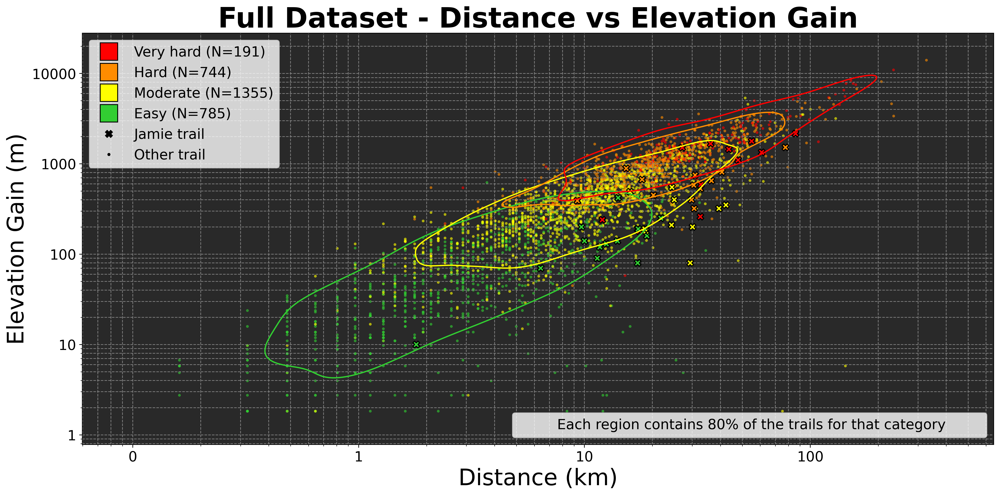

In [59]:
### Full Dataset - Distance vs Elevation Gain

"""
Converts difficulty to its corresponding index in difficultyColors
"""
def difficultyColourIndex(trailDifficulty):
    return int((trailDifficulty - 1) / 2)

# Defining Xs and Ys for difficulty categories
easyTrails = trainingTrails.query('difficulty==1')
easyDist = easyTrails.distance
easyGain = easyTrails.elevation_gain

medTrails = trainingTrails.query('difficulty==3')
medDist = medTrails.distance
medGain = medTrails.elevation_gain

hardTrails = trainingTrails.query('difficulty==5')
hardDist = hardTrails.distance
hardGain = hardTrails.elevation_gain

vHardTrails = trainingTrails.query('difficulty==7')
vHardDist = vHardTrails.distance
vHardGain = vHardTrails.elevation_gain

fig, ax = plt.subplots()

# Main scatter plot
shuffledTrainingTrails = trainingTrails.sample(frac=1)
trainingDist = shuffledTrainingTrails.distance
trainingGain = shuffledTrainingTrails.elevation_gain
trainingDifficultyColours = shuffledTrainingTrails.apply(lambda trail: difficultyColourIndex(trail.difficulty), axis=1).copy()
plt.scatter(trainingDist, trainingGain, s=20, c=difficultyColors[trainingDifficultyColours], marker='.', alpha=0.5, zorder=1)

# Scatter plot of my personal hikes
myDist = myCompletedTrails.distance
myGain = myCompletedTrails.elevation_gain
myDifficultyColours = myCompletedTrails.apply(lambda trail: difficultyColourIndex(trail.difficulty), axis=1).copy()
plt.scatter(myDist,  myGain,  s=60, c=difficultyColors[myDifficultyColours], marker='X', edgecolors='k', lw=1.2, zorder=2)

# Density countours
levels = 2
alphaLine = 1
thresh = 0.2
lineWidth = 1.5

sns.kdeplot(x=easyDist, y=easyGain, 
            cmap=ListedColormap(difficultyColors[0]), 
            log_scale=True, levels=levels, fill=False, alpha=alphaLine, thresh=thresh, linewidths=lineWidth, zorder=3)
sns.kdeplot(x=medDist, y=medGain, 
            cmap=ListedColormap(difficultyColors[1]), 
            log_scale=True, levels=levels, fill=False, alpha=alphaLine, thresh=thresh, linewidths=lineWidth, zorder=3)
sns.kdeplot(x=hardDist, y=hardGain, 
            cmap=ListedColormap(difficultyColors[2]), 
            log_scale=True, levels=levels, fill=False, alpha=alphaLine, thresh=thresh, linewidths=lineWidth, zorder=3)
sns.kdeplot(x=vHardDist, y=vHardGain, 
            cmap=ListedColormap(difficultyColors[3]), 
            log_scale=True, levels=levels, fill=False, alpha=alphaLine, thresh=thresh, linewidths=lineWidth, zorder=3)

# Main legend
legendElements1 = [Line2D([0], [0], marker='s', color='none', markerfacecolor=difficultyColors[3], markersize=20, 
                          label=f'Very hard (N={len(vHardTrails)})'),
                   Line2D([0], [0], marker='s', color='none', markerfacecolor=difficultyColors[2], markersize=20, 
                          label=f'Hard (N={len(hardTrails)})'),
                   Line2D([0], [0], marker='s', color='none', markerfacecolor=difficultyColors[1], markersize=20, 
                          label=f'Moderate (N={len(medTrails)})'),
                   Line2D([0], [0], marker='s', color='none', markerfacecolor=difficultyColors[0], markersize=20, 
                          label=f'Easy (N={len(easyTrails)})'),
                   Line2D([0], [0], marker='X', color='none', markerfacecolor='k', markersize=8, 
                          label=f'{masterUser} trail'),
                   Line2D([0], [0], marker='.', color='none', markerfacecolor='k', markersize=5, 
                          label=f'Other trail')]

legend1 = plt.legend(facecolor=legendColor, prop={'size': legendTextSize}, handles=legendElements1, loc=2)
plt.gca().add_artist(legend1)

# Info legend
legendElements2 = [Line2D([0], [0], marker='s', color='none', markerfacecolor='none', 
                         label=f'Each region contains {round((1-thresh)*100)}% of the trails for that category        ')]
plt.legend(facecolor=legendColor, prop={'size': legendTextSize}, handles=legendElements2, loc=4)
   
# Plot settings
ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))
ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
ax.set_facecolor(backgroundColor)
fig.patch.set_facecolor('w')
ax.grid(axis='both', which='both', linestyle='--', color='grey', zorder=0)
fig.set_dpi(DPI)
fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
plt.tight_layout()

title = 'Full Dataset - Distance vs Elevation Gain'
plt.title(title, size=titleSize, fontweight='bold')
plt.xlabel('Distance (km)', size=axisLabelSize)
plt.ylabel('Elevation Gain (m)', size=axisLabelSize)
plt.tight_layout()
plt.savefig(f'images/{title.replace(" ", "")}')
plt.show()

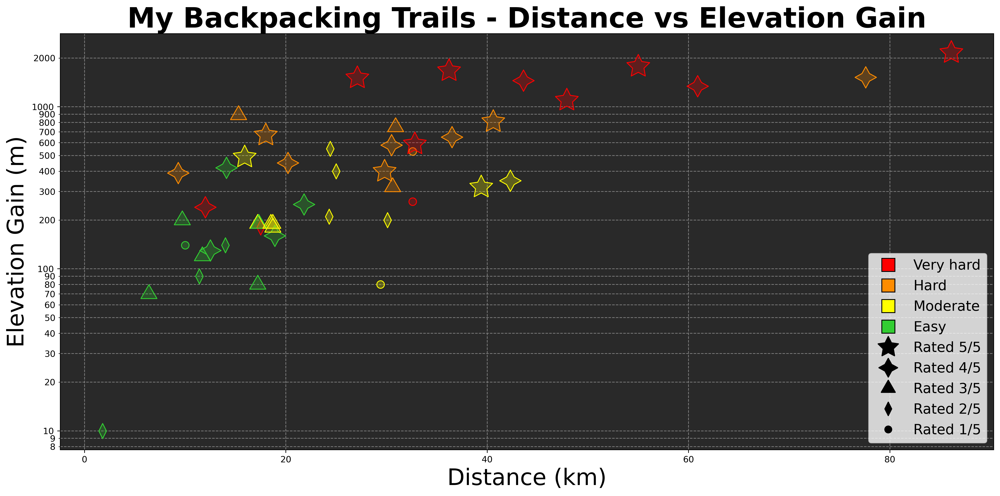

In [60]:
### My Backpacking Trails - Distance vs Elevation Gain (with Difficulty and Rating)

"""
Generates a plot of Distance vs Elevation Gain (with Difficulty and Rating)
"""
def distGainPlot(title,
                 xLabel,
                 ylabel,
                 dist,
                 gain,
                 rating,
                 difficulty,
                 annotations=[],
                 annotationLabel='Hike Number',
                 xLog=True,
                 savePlot=False):

    fig = plt.gcf()
    ax = plt.gca()
    ax.set_title(title, size=titleSize, fontweight='bold')

    markers = ['o', (2, 1, 0), (3, 1, 0), (4, 1, 0), (5, 1, 0)]
    markerSizes = [75, 300, 450, 600, 750]

    legendElements = [
        Line2D([0], [0], marker='s', c='none', label='Very hard', markerfacecolor=difficultyColors[3], markersize=15),
        Line2D([0], [0], marker='s', c='none', label='Hard', markerfacecolor=difficultyColors[2], markersize=15),
        Line2D([0], [0], marker='s', c='none', label='Moderate', markerfacecolor=difficultyColors[1], markersize=15),
        Line2D([0], [0], marker='s', c='none', label='Easy', markerfacecolor=difficultyColors[0], markersize=15),
        Line2D([0], [0], marker=markers[4], c='none', label='Rated 5/5', markerfacecolor='k', markersize=25),
        Line2D([0], [0], marker=markers[3], c='none', label='Rated 4/5', markerfacecolor='k', markersize=22),
        Line2D([0], [0], marker=markers[2], c='none', label='Rated 3/5', markerfacecolor='k', markersize=19),
        Line2D([0], [0], marker=markers[1], c='none', label='Rated 2/5', markerfacecolor='k', markersize=16),
        Line2D([0], [0], marker=markers[0], c='none', label='Rated 1/5', markerfacecolor='k', markersize=8)
    ]

    if len(annotations) > 0:
        legendElements.append(
            Line2D([0], [0], marker='$\#$', c='none', label=annotationLabel,
                   markerfacecolor='w', markersize=12, mew=0.67)
        )

    ax.legend(handles=legendElements, facecolor=legendColor, prop={'size': legendTextSize}, loc=4)

    shadowEffect = [path_effects.withStroke(linewidth=2, foreground='black', alpha=0.6)]

    if len(annotations) > 0:
        for _x, _y, _r, _c, _a in zip(dist, gain, rating, difficultyColors[difficulty], annotations):
            ratingIndex = int(round(_r) - 1)
            plt.scatter(_x, _y, facecolors=[mcolors.to_rgba(_c, alpha=0.25)], edgecolors=[mcolors.to_rgba(_c, alpha=1)],
                        marker=markers[ratingIndex], s=markerSizes[ratingIndex], zorder=2, linewidths=1)
            annotation = ax.annotate(round(_a), (_x, _y), c='w', size=8, ha='center', va='center')
            annotation.set_path_effects(shadowEffect)
    else:
        for _x, _y, _r, _c in zip(dist, gain, rating, difficultyColors[difficulty]):
            ratingIndex = int(round(_r) - 1)
            plt.scatter(_x, _y, facecolors=[mcolors.to_rgba(_c, alpha=0.25)], edgecolors=[mcolors.to_rgba(_c, alpha=1)],
                        marker=markers[ratingIndex], s=markerSizes[ratingIndex], zorder=2, linewidths=1)

    fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
    plt.rcParams['axes.facecolor'] = backgroundColor
    fig.set_dpi(DPI)

    ax.set_yscale('log')
    if xLog:
        ax.set_xscale('log')

    plt.xlabel(xLabel, size=axisLabelSize)
    plt.ylabel(ylabel, size=axisLabelSize)
    plt.grid(axis='both', which='both', ls='--', c='grey', zorder=0)

    ax.tick_params(axis='both', which='both', labelsize=10)
    ax.xaxis.set_minor_formatter(mticker.ScalarFormatter())
    ax.xaxis.set_major_formatter(mticker.ScalarFormatter())
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.0f'))
    ax.yaxis.set_minor_formatter(mticker.FormatStrFormatter('%.0f'))

    fig.patch.set_facecolor('w')
    plt.tight_layout()

    if savePlot:
        plt.savefig(f'images/{title.replace(" ", "")}')

    plt.show()


# Generating Distance vs Elevation Gain plot for my completed trails
distCompleted = myCompletedTrails.distance
gainCompleted = myCompletedTrails.elevation_gain
ratingCompleted = myCompletedTrails.rating
diffCompleted = myCompletedTrails.apply(lambda trail: difficultyColourIndex(trail.difficulty), axis=1)
numDays = myCompletedTrails.days

distGainPlot('My Backpacking Trails - Distance vs Elevation Gain',
             'Distance (km)',
             'Elevation Gain (m)',
             distCompleted,
             gainCompleted,
             ratingCompleted,
             diffCompleted,
             # numDays,
             # annotationLabel='Number of days',
             xLog=False,
             savePlot=True)

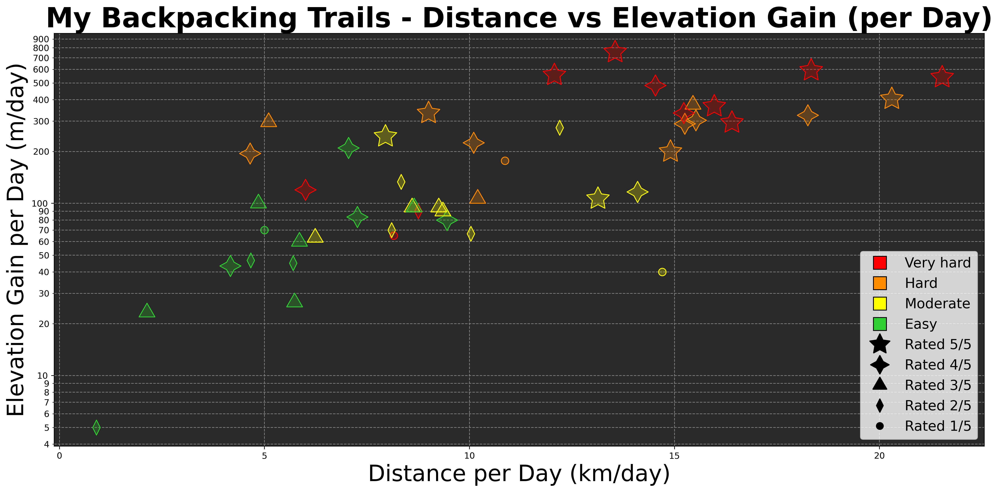

In [61]:
### My Backpacking Trails - Distance vs Elevation Gain Per Day (with Difficulty and Rating)

distPerDay = myCompletedTrails.distance.divide(myCompletedTrails.days)
gainPerDay = myCompletedTrails.elevation_gain.divide(myCompletedTrails.days)

distGainPlot('My Backpacking Trails - Distance vs Elevation Gain (per Day)', 
             'Distance per Day (km/day)',
             'Elevation Gain per Day (m/day)',
             distPerDay, 
             gainPerDay, 
             ratingCompleted,
             diffCompleted,
             # numDays,
             # annotationLabel = 'Number of days',
             xLog = False,
             savePlot = True)

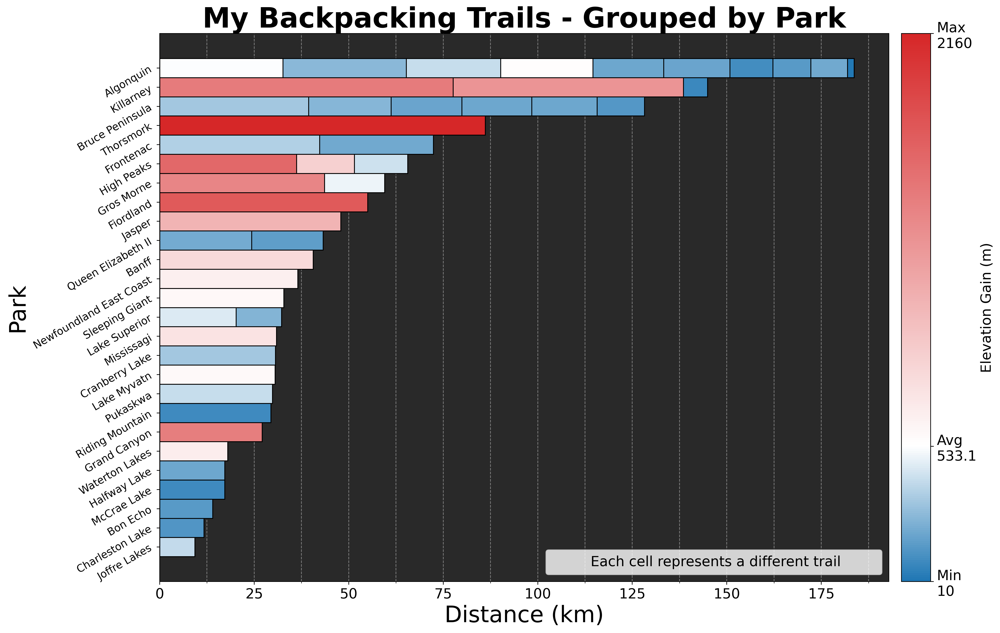

In [62]:
### My Backpacking Trails - Grouped by Park

"""
Determines which group to add the trail to and determines bar color
"""
def addTrailToBarStack(trail, barFeature, colorFeature, groups, groupBy, barValues, barColors):
    barStackIndex = groups.tolist().index(trail[groupBy])
    barStack = barValues[:, barStackIndex]
    
    # Fill the first empty slot
    for j, barValue in enumerate(barStack):
        if barValue == 0:
            barValues[j, barStackIndex] = trail[barFeature]
            barColors[j, barStackIndex] = trail[colorFeature]
            break

"""
No need for a space if there is no unit
"""
def setUnitSpace(hasSpace):
    if hasSpace == True:
        return ' '
    else:
        return ''

"""
Produces an decendeing coloured bar chart, grouped by a specified feature (groupBy)
Bar height is determined by an inputed feature (barFeature)
Bar colour is determined by another inputed feature (colorFeature)
"""
def stackedBarPlot(plotTitle, 
                   xLabel,
                   trails,
                   barFeature,
                   colorRange = hotColdColors,
                   colorFeature = None, # defaults to barFeature
                   colorLabel = '',
                   groupBy = 'park',
                   barThickness = 0.4,
                   savePlot = False):
    
    if colorFeature == None:
        colorFeature = barFeature 

    groups = trails[[groupBy, barFeature]].groupby(groupBy).sum().sort_values(barFeature, ascending=True)
    groups = groups.reset_index()[groupBy]
    
    numBarsStacked = trails[groupBy].value_counts().iloc[0]
    barValues = np.zeros((numBarsStacked, len(groups)))
    barColors = np.zeros((numBarsStacked, len(groups)))

    sortedTrails = trails[[groupBy, barFeature, colorFeature]].sort_values([groupBy, barFeature], 
                                                                           ascending=[True, False])
    
    sortedTrails.apply(lambda trail: addTrailToBarStack(trail, barFeature, colorFeature, 
                                                        groups, groupBy, barValues, barColors), axis=1)
            
    # Setting up bar colors
    cRangeMax = sortedTrails[colorFeature].max()
    cRangeMin = sortedTrails[colorFeature].min()
    cAvg = sortedTrails[colorFeature].mean()
    colorList = [(0.0, colorRange[0]), 
                 (cAvg/cRangeMax, colorRange[1]), 
                 (1.0, colorRange[2])]
    cmap = mcolors.LinearSegmentedColormap.from_list('', colorList)
    barColors /= cRangeMax # Normalizing

    fig = plt.gcf()
    ax = plt.gca()

    for i in range(barValues.shape[0]):
        ax.barh(groups, 
                barValues[i], 
                left = np.sum(barValues[:i], axis = 0), 
                color=cmap(barColors[i]),
                edgecolor='k',
                height=1,
                zorder=2)
        
    legendElements = [Line2D([0], [0], marker='s', c='none', label='Each cell represents a different trail        ')]
    ax.legend(handles=legendElements, facecolor=legendColor, prop={'size': legendTextSize})
    
    ax.yaxis.set_major_locator(mticker.FixedLocator(range(len(groups))))
    ax.set_yticklabels(groups, rotation = 30, ha='right')
    ax.tick_params(axis='x', which='both', labelsize=tickLabelSize)
    ax.tick_params(axis='y', which='both', labelsize=12)
    ax.set_title(plotTitle, size=titleSize, fontweight='bold')

    ax.xaxis.grid(True, which='minor')
    ax.xaxis.set_minor_locator(AutoMinorLocator(2))
    
    plt.grid(axis='x', which='both', ls='--', c='grey', zorder=0)
    plt.grid(axis='y', which='both', ls='none')
    plt.xlabel(xLabel, size=axisLabelSize)
    plt.ylabel(groupBy.capitalize(), size=axisLabelSize)
    fig.set_size_inches(standardCanvasWidth, 1.6 + len(groups)*barThickness)
    fig.set_dpi(DPI)
    fig.patch.set_facecolor('w')
    plt.rcParams['axes.facecolor'] = backgroundColor
    
    # Setting colorbar
    sm = cm.ScalarMappable(cmap=cmap)
    tick_locs = np.asarray(np.asarray(colorList)[:,0], dtype='float')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='4%', pad=0.2)
    cbar = plt.colorbar(sm, orientation='vertical', ticks=tick_locs, cax=cax)
    cbar.set_label(colorLabel, size=tickLabelSize)
    cbar.ax.tick_params(labelsize=tickLabelSize)
    cbar.set_ticklabels([f'Min\n{round(cRangeMin, 1)}',
                         f'Avg\n{round(cAvg, 1)}',
                         f'Max\n{round(cRangeMax, 1)}'])
    plt.tight_layout()
    
    if savePlot == True:
        plt.savefig(f'images/{plotTitle.replace(" ", "")}', bbox_inches='tight')
    plt.show()

stackedBarPlot(plotTitle = 'My Backpacking Trails - Grouped by Park',
               xLabel = 'Distance (km)',
               trails = myCompletedTrails,
               barFeature = 'distance',
               colorFeature = 'elevation_gain',
               colorLabel = 'Elevation Gain (m)',
               groupBy = 'park',
               barThickness = 0.33,
               savePlot = True)

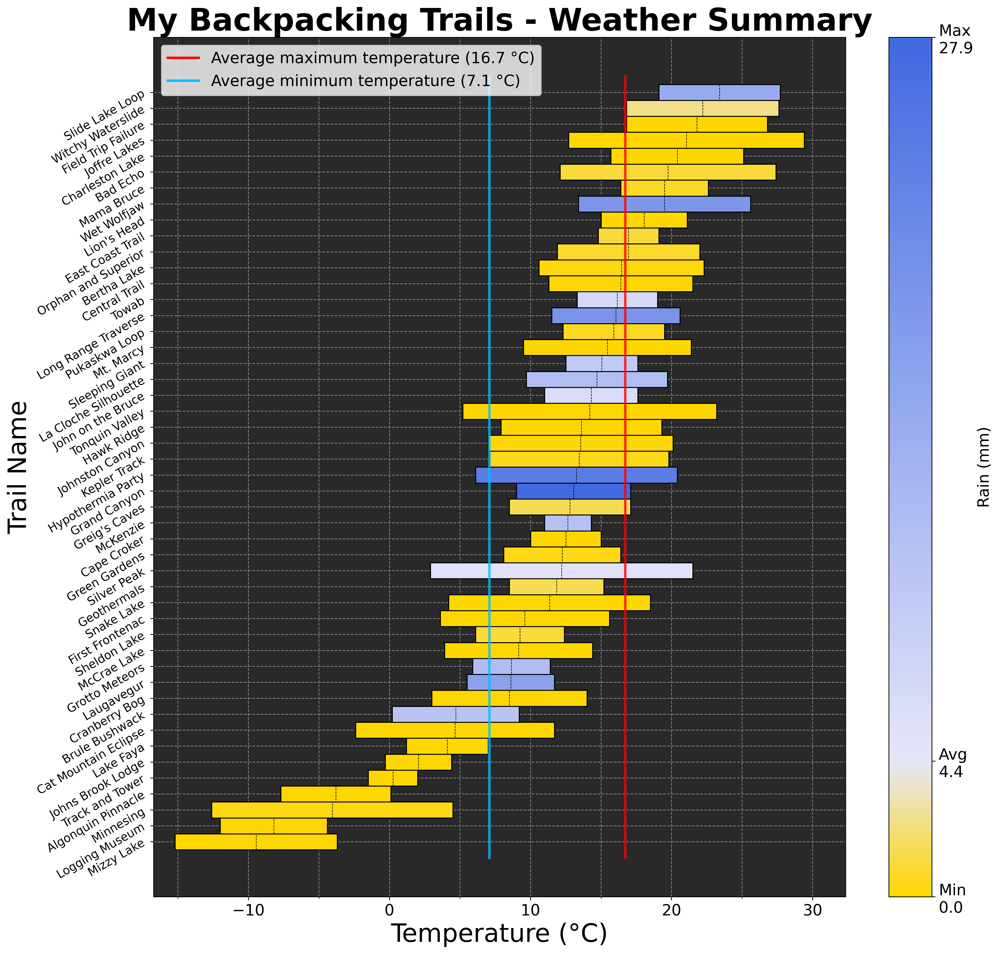

In [63]:
### My Backpacking Trails - Weather Summary

"""
Produces a descending coloured bar chart sorted by `sortBy`.
Bar height is determined by `barTop`.
`barBottom` determines the starting position of the bar (useful for ranges).
Bar colour is determined by another inputted feature (`colorCol`).
"""
def colorBarPlot(plotTitle,
                 xLabel,
                 trails,
                 barUnits,
                 barTop,
                 barTopLabel,
                 colorRange,
                 colorMinMax=None,
                 barBottom=0,
                 barBottomLabel='',
                 barUnitSpace=True,
                 colorCol=None,  # defaults to barTop
                 colorLabel='',
                 yTicks='name',
                 yLabel='Trail Name',
                 xBounds=None,
                 legendLocation='upper right',
                 sortBy=None,  # defaults to barTop
                 barThickness=0.3,
                 savePlot=False):
    
    if colorCol is None:
        colorCol = barTop
    if sortBy is None:
        sortBy = barTop

    BUS = setUnitSpace(barUnitSpace)
    avgTop = trails[barTop].mean()
    numBarTrails = len(trails)

    fig = plt.gcf()
    ax = plt.gca()

    ax.set_title(plotTitle, size=titleSize, fontweight='bold')
    plt.xlabel(xLabel, size=axisLabelSize)
    plt.ylabel(yLabel, size=axisLabelSize)

    trails = trails.sort_values(by=[sortBy], ascending=True)

    ax.yaxis.set_major_locator(mticker.FixedLocator(range(len(trails[yTicks]))))
    ax.set_yticklabels(trails[yTicks], rotation=30, ha='right')

    fig.set_size_inches(standardCanvasWidth, 1.6 + len(trails) * barThickness)
    ax.xaxis.grid(True, which='minor')
    ax.xaxis.set_minor_locator(AutoMinorLocator(2))
    ax.tick_params(axis='y', which='major', labelsize=12)
    ax.tick_params(axis='x', which='both', labelsize=tickLabelSize)

    plt.rcParams['axes.facecolor'] = backgroundColor
    fig.set_dpi(DPI)

    # Handle bar bottom input (can be int or column)
    bottomIsInt = isinstance(barBottom, int)
    if bottomIsInt:
        barBottoms = [barBottom] * numBarTrails
        plt.grid(axis='x', which='both', ls='--', c='grey', zorder=0)
        plt.grid(axis='y', which='both', ls='none')
    else:
        barBottoms = trails[barBottom]
        plt.grid(axis='both', which='both', ls='--', c='grey', zorder=0)
        avgBottom = trails[barBottom].mean()
        barBtmLabel = f'Average {barBottomLabel} ({round(avgBottom, 1)}{BUS + barUnits})'
        topAvgColor = 'red'

        # Averages + legend
        averagesLS = '-'
        averagesLW = 2.5
        bottomAvgColor = 'deepskyblue'
        barTopLabel = f'Average {barTopLabel} ({round(avgTop, 1)}{BUS + barUnits})'
    
        ax.plot([avgTop, avgTop], [-1, numBarTrails], topAvgColor,
                lw=averagesLW, ls=averagesLS, zorder=4, alpha=0.8)
    
        legendElements = [Line2D([0], [0], color=topAvgColor, ls=averagesLS, lw=averagesLW, label=barTopLabel)]

        ax.plot([avgBottom, avgBottom], [-1, numBarTrails], c=bottomAvgColor,
                lw=averagesLW, ls=averagesLS, zorder=4, alpha=0.8)
        legendElements.append(Line2D([0], [0], color=bottomAvgColor, ls=averagesLS, lw=averagesLW, label=barBtmLabel))

        plt.legend(facecolor=legendColor, prop={'size': legendTextSize},
                   handles=legendElements, loc=legendLocation)

    # Bar values and limits
    barTops = trails[barTop] - barBottoms
    if xBounds is None:
        plt.xlim(np.min(barBottoms) * 1.1, np.max(trails[barTop]) * 1.1)
    else:
        plt.xlim(xBounds[0], xBounds[1])

    # Set up color mapping
    colorValues = trails[colorCol]
    
    if colorMinMax is None:
        cRangeMin = colorValues.min()
        cRangeMax = colorValues.max()
    else:
        cRangeMin = colorMinMax[0]
        cRangeMax = colorMinMax[1]
        
    cAvg = colorValues.mean()
    colorList = [
        (0.0, colorRange[0]),
        ((cAvg - cRangeMin) / (cRangeMax - cRangeMin), colorRange[1]),
        (1.0, colorRange[2])
    ]
    cmap = mcolors.LinearSegmentedColormap.from_list('', colorList)

    # Colorbar
    sm = cm.ScalarMappable(cmap=cmap)
    tick_locs = np.asarray([x[0] for x in colorList], dtype='float')
    cbar = plt.colorbar(sm, orientation='vertical', ticks=tick_locs, ax=ax)
    cbar.set_label(colorLabel, size=tickLabelSize)
    cbar.ax.tick_params(labelsize=tickLabelSize)
    cbar.set_ticklabels([
        f'Min\n{round(cRangeMin, 1)}',
        f'Avg\n{round(cAvg, 1)}',
        f'Max\n{round(cRangeMax, 1)}'
    ])

    plt.barh(
        trails[yTicks],
        barTops,
        left=barBottoms,
        color=cmap(((colorValues - cRangeMin) / (cRangeMax - cRangeMin)).astype('float')),
        height=1,
        edgecolor='k',
        zorder=2
    )

    # Optional secondary line plot for sortBy != barTop
    if sortBy != barTop:
        stepY = (np.array(range(numBarTrails)) - 0.5).tolist()
        stepY.append(stepY[-1] + 1)
        stepX = ((trails[barTop] + barBottoms) / 2).tolist()
        stepX.append(stepX[-1])
        ax.step(stepX, stepY, c='k', where='pre', ls='--', lw=0.6, zorder=3)

    fig.patch.set_facecolor('w')

    if savePlot:
        plt.savefig(f'images/{plotTitle.replace(" ", "")}', bbox_inches='tight')

    plt.show()
    
colorBarPlot(plotTitle = 'My Backpacking Trails - Weather Summary',
             xLabel = 'Temperature (°C)',
             trails = myCompletedTrails,
             barUnits = '°C',
             barTop = 'max_temp',
             barTopLabel = 'maximum temperature',
             barBottom = 'min_temp',
             barBottomLabel = 'minimum temperature',
             colorRange = ['gold', 'lavender', 'royalblue'],
             colorCol = 'rain',
             colorLabel = 'Rain (mm)',
             legendLocation = 'upper left',
             sortBy = 'avg_temp',
             barThickness = 0.3,
             savePlot = True)

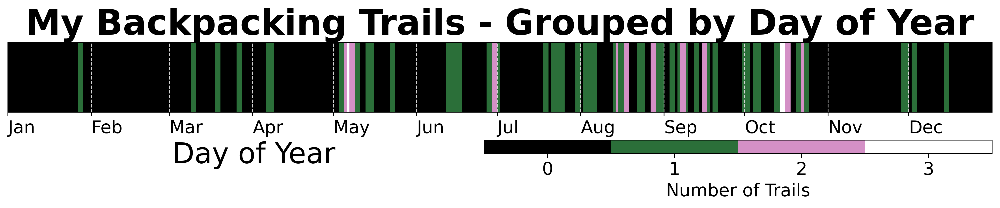

In [64]:
### My Backpacking Trails - Grouped by Day of Year

"""
Adds a trail's date range to the counts list (length 366),
where each element of counts represents a day of the year.
Accounts for leap years by offsetting post-February dates.
"""
def addTrailToCounts(trail, counts):
    trailDateRange = pd.date_range(trail.start_date, trail.end_date, freq='d')
    
    for trailDate in trailDateRange:
        if not calendar.isleap(trailDate.year) and trailDate.month > 2:
            counts[trailDate.timetuple().tm_yday] += 1
        else:
            counts[trailDate.timetuple().tm_yday - 1] += 1

trailCounts = np.zeros(366)
myCompletedTrails.apply(lambda trail: addTrailToCounts(trail, trailCounts), axis=1)

# Create a list of 366 dates in a leap year (ensures Feb 29 exists)
leapYear = dt.datetime(2020, 1, 1)  # Arbitrary leap year
periods = [leapYear + dt.timedelta(days=i) for i in range(366)]

cmap = plt.get_cmap('cubehelix', trailCounts.max() + 1)

fig = plt.figure(figsize=(standardCanvasWidth, standardCanvasHeight / 7))
fig.set_dpi(DPI)
ax = plt.gca()

ax.bar(periods, 1, align='edge', width=1, linewidth=0, color=cmap(trailCounts / trailCounts.max()), zorder=0)

# Formatting x-axis with months
ax.xaxis.set_major_locator(MonthLocator())
ax.xaxis.set_major_formatter(DateFormatter('%b'))
ax.set_xlim(periods[0], periods[-1] + dt.timedelta(hours=23))
for label in ax.xaxis.get_ticklabels():
    label.set_horizontalalignment('left')
ax.xaxis.set_tick_params(labelsize=tickLabelSize)

plt.grid(axis='x', which='both', ls='--', c='lightgrey', zorder=1)
title = 'My Backpacking Trails - Grouped by Day of Year'
ax.set_title(title, size=titleSize, fontweight='bold')
ax.set_xlabel('Day of Year', size=axisLabelSize, x=0.25)
plt.yticks([])
plt.ylim(0, 1)

# Colorbar setup
sm = cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0, max(trailCounts)))
n_clusters = max(trailCounts) + 1
tick_locs = (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters
cbar = plt.colorbar(
    sm, orientation='horizontal',
    cax=fig.add_axes([0.5, -0.35, 0.4, 0.15])
)
cbar.set_label('Number of Trails', size=tickLabelSize)
cbar.set_ticks(tick_locs)
cbar.ax.tick_params(labelsize=tickLabelSize)
cbar.set_ticklabels(range(int(n_clusters)))
cbar.outline.set_edgecolor('black')
cbar.outline.set_linewidth(0.8)

fig.patch.set_facecolor('w')
plt.savefig(f'images/{title.replace(" ", "")}', bbox_inches='tight')
plt.show()

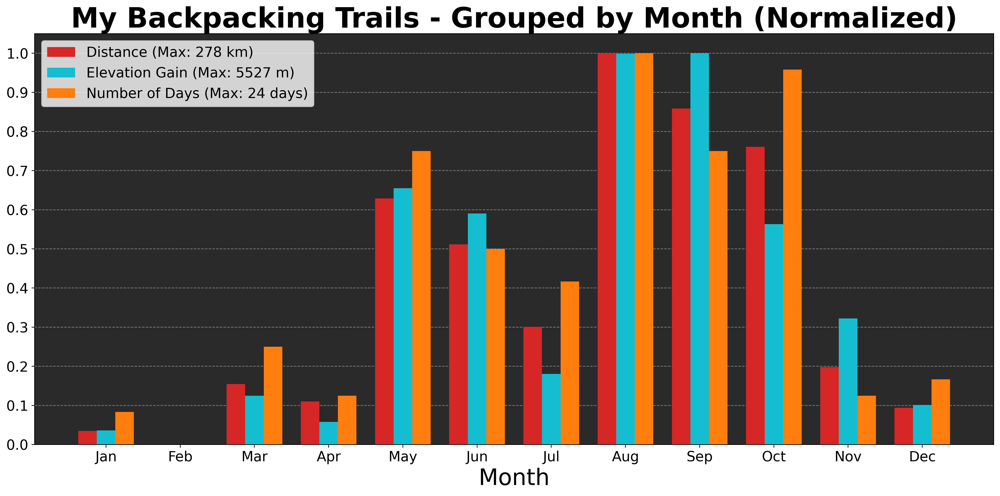

In [65]:
### My Backpacking Trails - Grouped by Month (Normalized)

"""
Adds a trail feature to a given month (in barValues).
If a trail spans multiple months, divides the feature evenly over its days.
"""
def addTrailToMonth(trail, feature, barValues):
    trailDateRange = pd.date_range(trail.start_date, trail.end_date, freq='d')
    for trailDate in trailDateRange:
        barValues[trailDate.month - 1] += trail[feature] / trail.days

"""
Generates a plot of trail features grouped by month, normalized within each feature.
"""
def summaryByMonthPlot(plotTitle, trails, legendLabels, units, features, colors):
    fig = plt.gcf()
    ax = plt.gca()
    periods = np.arange(12)
    barsPerMonth = len(features)
    barWidth = 1/(1 + barsPerMonth)
    
    for featureIndex, feature in enumerate(features):
        barValues = np.zeros(12)
        trails.apply(lambda trail: addTrailToMonth(trail, feature, barValues), axis=1)
        
        # Calculate bar positions to align side-by-side
        if featureIndex == 0:
            position = -(barsPerMonth - 1)*barWidth/2
        else:
            position += barWidth

        ax.bar(periods + position,
               barValues / barValues.max(),  # Normalizing
               width=barWidth,
               linewidth=0,
               color=colors[featureIndex],
               label=f'{legendLabels[featureIndex]} (Max: {round(barValues.max())} {units[featureIndex]})',
               zorder=2)

    fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
    fig.set_dpi(DPI)
    ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
    plt.grid(axis='y', which='both', linestyle='--', color='grey', zorder=0)
    plt.grid(axis='x', which='both', linestyle='none')
    plt.xticks(periods, months)
    plt.locator_params(axis='y', nbins=11)

    ax.set_title(plotTitle, size=titleSize, fontweight='bold')
    ax.set_xlabel('Month', size=axisLabelSize)
    plt.legend(facecolor=legendColor, prop={'size': legendTextSize})
    
    fig.patch.set_facecolor('w')
    plt.rcParams['axes.facecolor'] = backgroundColor
    plt.tight_layout()
    plt.savefig(f'images/{plotTitle.replace(" ", "")}')
    plt.show()

summaryByMonthPlot(plotTitle = 'My Backpacking Trails - Grouped by Month (Normalized)', 
                   trails = myCompletedTrails,
                   features = ['distance', 'elevation_gain', 'days'],
                   colors = ['tab:red', 'tab:cyan', 'tab:orange'],
                   legendLabels = ['Distance', 'Elevation Gain', 'Number of Days'],
                   units = ['km', 'm', 'days'])

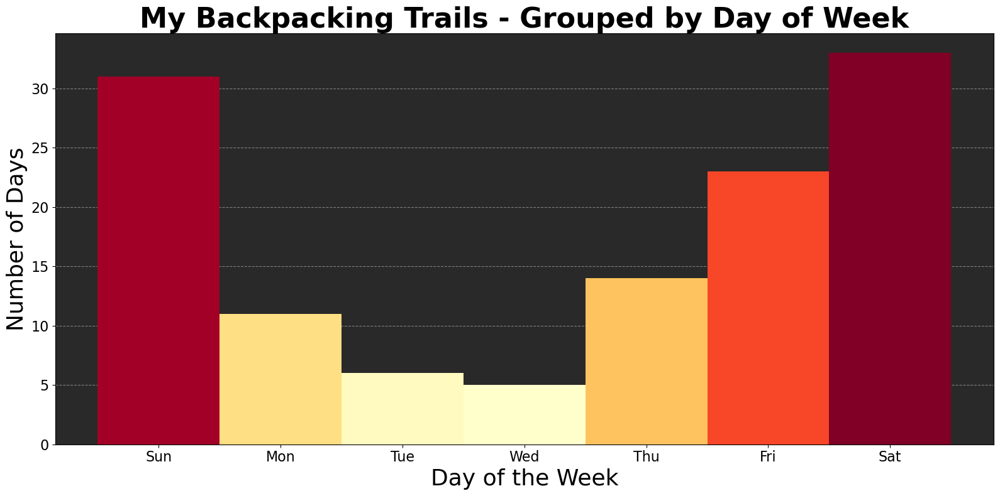

In [66]:
### My Backpacking Trails - Grouped by Day of Week

# Generate a list of all hiking days across all backpacking trails
dayOccurrences = pd.concat([
    pd.Series(pd.date_range(start, end))
    for start, end in zip(myCompletedTrails['start_date'], 
                          myCompletedTrails['end_date'])
]).dt.day_name()

# Count occurrences by day of week and rename to abbreviations
dayCounts = dayOccurrences.value_counts().reindex(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])
dayCounts.index = dayCounts.index.map({
    'Sunday': 'Sun', 'Monday': 'Mon', 'Tuesday': 'Tue','Wednesday': 'Wed', 'Thursday': 'Thu', 'Friday': 'Fri', 'Saturday': 'Sat'
})

# Normalize for colormap
norm = Normalize(vmin=dayCounts.min(), vmax=dayCounts.max())
cmap = cm.YlOrRd

plt.figure(figsize=(standardCanvasWidth, standardCanvasHeight))
bars = plt.bar(dayCounts.index,
               dayCounts.values,
               color=cmap(norm(dayCounts.values)),
               width=1,
               zorder=2)

plt.title('My Backpacking Trails - Grouped by Day of Week', size=titleSize, fontweight='bold')
plt.xlabel('Day of the Week', size=axisLabelSize)
plt.ylabel('Number of Days', size=axisLabelSize)
plt.xticks(size=tickLabelSize)
plt.yticks(size=tickLabelSize)
plt.grid(axis='y', which='both', linestyle='--', color='grey', zorder=0)
plt.grid(axis='x', which='both', linestyle='none')

fig = plt.gcf()
fig.patch.set_facecolor('w')
plt.tight_layout()
plt.savefig('images/MyBackpackingTrails-GroupedByDayOfWeek')
plt.show()

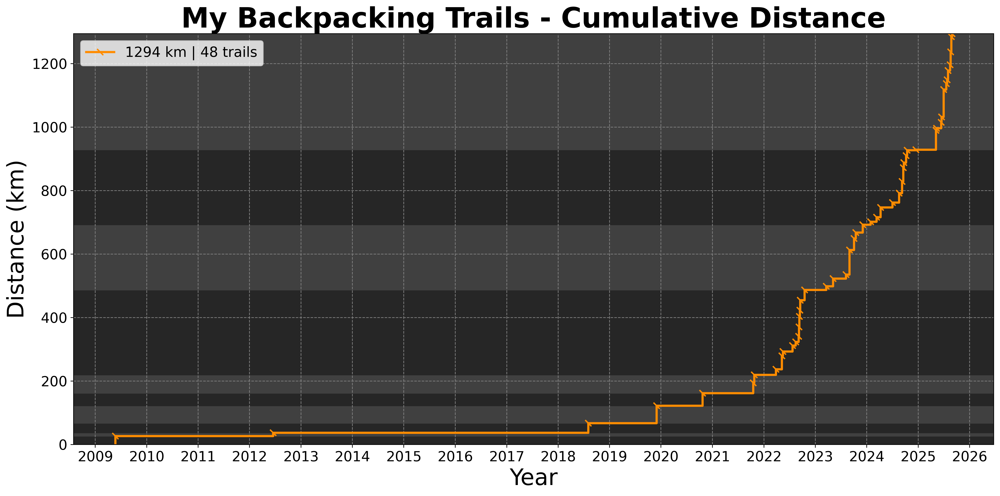

In [67]:
### My Backpacking Trails - Cumulative Distance

# Create cumulative distance and matching end-date axis
distCum = pd.concat([pd.Series([0]), myCompletedTrails['distance'].cumsum()])
xDates = pd.concat([
    pd.Series([myCompletedTrails['end_date'].iloc[0]]),
    myCompletedTrails['end_date']
])

fig, ax = plt.subplots(figsize=(standardCanvasWidth, standardCanvasHeight), dpi=DPI)
title = 'My Backpacking Trails - Cumulative Distance'
ax.set_title(title, size=titleSize, fontweight='bold')

plt.step(xDates, distCum,
         where='post',
         linewidth=2.5,
         markevery=(1, 1),
         marker=(2, 2, 45),
         markersize=10,
         mew=1.5,
         color='darkorange',
         zorder=2,
         label=f'{round(myCompletedTrails["distance"].sum())} km | {len(myCompletedTrails)} trails')

# Add alternating year background spans
years = xDates.apply(lambda date: date.year).tolist()
distinctYears = [years[0]]
calendarYearBarRollingValue = 0

for i, (year, dist) in enumerate(zip(years, distCum)):
    nextYear = years[i+1] if i + 1 < len(years) else None

    if len(distinctYears) % 2 == 0:
        shadeColor = '0.25'
    else:
        shadeColor = '0.15'

    if nextYear and nextYear not in distinctYears:
        ax.axhspan(calendarYearBarRollingValue, dist, facecolor=shadeColor, edgecolor=shadeColor, zorder=0)
        calendarYearBarRollingValue = dist
        distinctYears.append(nextYear)
    elif i == len(years) - 1:
        ax.axhspan(calendarYearBarRollingValue, dist, facecolor=shadeColor, edgecolor=shadeColor, zorder=0)

ax.set_ylim(0, distCum.max())
ax.set_xlabel('Year', size=axisLabelSize)
ax.set_ylabel('Distance (km)', size=axisLabelSize)
ax.xaxis.set_major_locator(YearLocator())
ax.xaxis.set_major_formatter(DateFormatter('%Y'))
ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
ax.grid(axis='both', which='both', linestyle='--', color='grey', zorder=1)

plt.legend(facecolor=legendColor, prop={'size': legendTextSize}, loc='upper left')
plt.rcParams['axes.facecolor'] = backgroundColor
fig.patch.set_facecolor('w')
plt.tight_layout()
plt.savefig(f'images/{title.replace(" ", "")}')
plt.show()

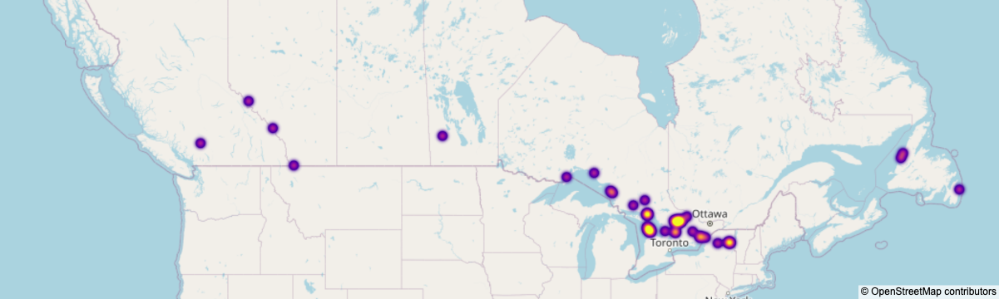

In [68]:
### Trail Locations on Map

fig = px.density_mapbox(myCompletedTrails, 
                        lat='lat', lon='lng', radius=10,
                        center=dict(lat=50, lon=-95), zoom=3.2,
                        mapbox_style='open-street-map')

fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.update(layout_coloraxis_showscale=False)
fig.show()

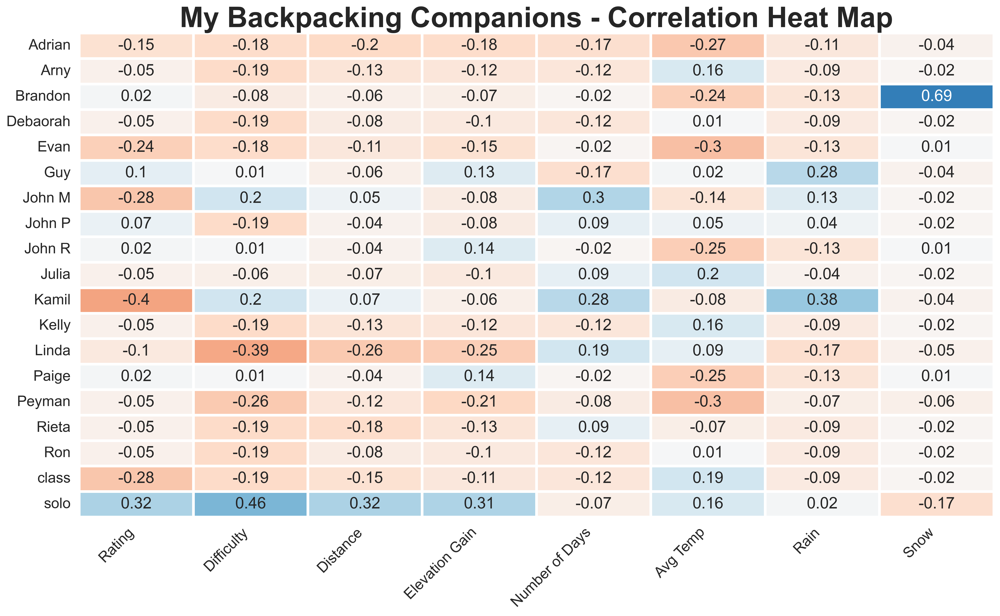

In [60]:
### My Completed Trails - Correlation Heat Map

"""
Generates correlation heat map for the given columns.
"""
def corrHeatMap(titleStart, 
                trails, 
                xCols,
                yCols = [],
                xLabels = '',
                yLabels = '',
                canvasHeight = standardCanvasHeight,
                save = True):
    
    # Setting defaults
    if len(yCols) == 0:
        yCols = xCols
        
    if xLabels == '':
        xLabels = xCols
        
    if yLabels == '':
        if xCols != yCols:
            yLabels = yCols
        else:
            yLabels = xLabels
    
    if xCols != yCols:
        trails = trails[xCols + yCols]
    else:
        trails = trails[xCols]
        
    corr = trails.corr().round(2)
    
    if xCols != yCols:
        corr = corr.drop(yCols, axis=1)
        corr = corr.drop(xCols, axis=0)
        
    sns.set(rc={'figure.figsize':(standardCanvasWidth, canvasHeight)})
    sns.set(font_scale = 1.5)
    heatmap = sns.heatmap(corr, annot=True, vmin=-1, vmax=1, center= 0, cmap='RdBu', linewidths=3, cbar=False)
    
    fig = plt.gcf()
    ax = plt.gca()
    
    fig.set_dpi(DPI)
    ax.set_xticklabels(xLabels, rotation=45, ha='right')
    ax.set_yticklabels(yLabels)
    title = f'{titleStart} - Correlation Heat Map'
    ax.set_title(title, size=titleSize, fontweight='bold')
    fig.patch.set_facecolor('w')
    plt.tight_layout()
    
    if save:
        plt.savefig(f'images/{title.replace(" ", "")}')

    plt.show()

corrHeatMap('My Backpacking Companions', 
            myCompletedTrails, 
            ['rating', 'difficulty', 'distance', 'elevation_gain', 'days', 'avg_temp', 'rain', 'snow'],
            myBackpackingCompanions + ['solo'],
            ['Rating', 'Difficulty', 'Distance', 'Elevation Gain', 'Number of Days', 'Avg Temp', 'Rain', 'Snow'],
            canvasHeight = 10,
            save = False)

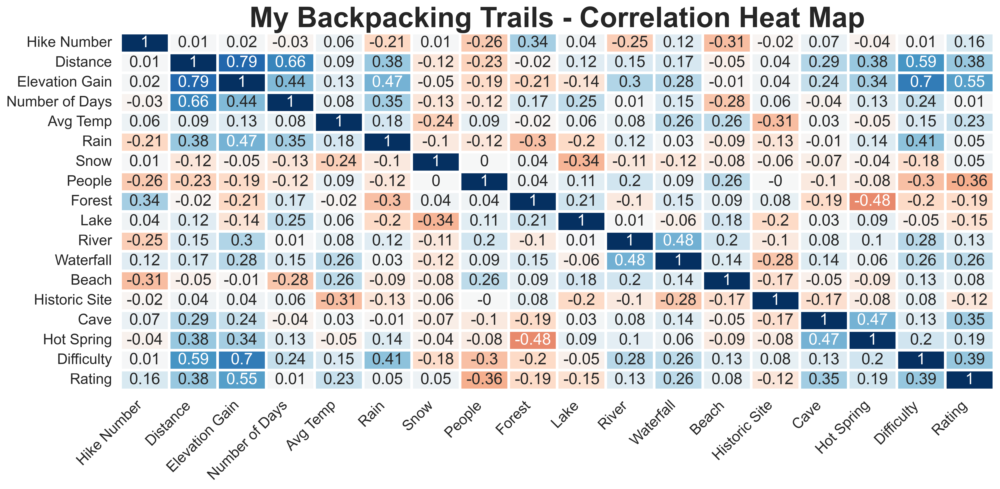

In [63]:
### My Completed Trails - Correlation Heat Map

myHeatMapColumns = ['order','distance','elevation_gain','days','avg_temp','rain','snow', 'num_people', 'forest',
                    'lake','river','waterfall','beach','historic_site','cave','hot_spring','difficulty','rating']

myHeatMapLabels = ['Hike Number','Distance','Elevation Gain','Number of Days','Avg Temp','Rain','Snow', 'People','Forest',
                   'Lake','River','Waterfall','Beach','Historic Site','Cave','Hot Spring','Difficulty','Rating']

corrHeatMap('My Backpacking Trails', 
            myCompletedTrails,
            myHeatMapColumns, 
            xLabels = myHeatMapLabels)

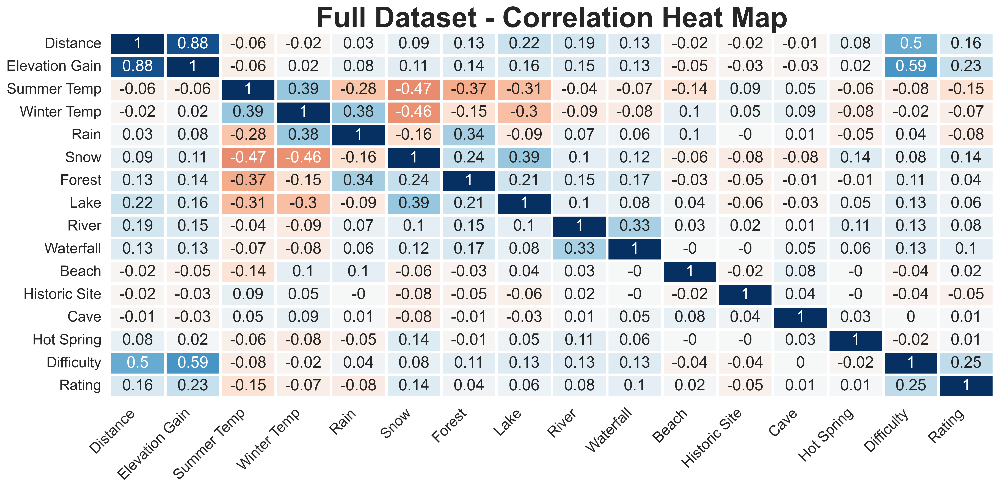

In [62]:
### Full Dataset - Correlation Heat Map

fullHeatMapColumns = ['distance','elevation_gain','summer_temp','winter_temp','annual_rain','annual_snow', 'forest',
                      'lake','river','waterfall','beach','historic_site','cave','hot_spring','difficulty','rating']

fullHeatMapLabels = ['Distance','Elevation Gain','Summer Temp','Winter Temp','Rain','Snow','Forest',
                     'Lake','River','Waterfall','Beach','Historic Site','Cave','Hot Spring','Difficulty','Rating']

corrHeatMap('Full Dataset', 
            trainingTrails, 
            fullHeatMapColumns, 
            xLabels = fullHeatMapLabels)

<b><font size="3">Training Difficulty Model</font></b>

In [69]:
### Setting Up Dataframe For Training

# The columns used to estimate difficulty and rating
xCols = ['distance', 'elevation_gain', # Movement
         'park', 'region', 'province', 'country', # Location
         'summer_temp', 'winter_temp', 'annual_rain', 'annual_snow', # Climate TODO: Add wind speed (10m)
         'forest', 'lake', 'river', 'waterfall', 'beach', 'historic_site', 'cave', 'hot_spring', # Physical features
         'backpacking', 'num_reviews', 'route_type', 'route_source', 'user'] # Misc

trainingTrailsXCols = trainingTrails[xCols]
trainingTrailsDifficulty = trainingTrails.difficulty
trainingTrailsRating = trainingTrails.rating

shortlistTrailsXCols = shortlistTrails[xCols]

# Needed to normalize data before training and predicting later
numericTrainingData = trainingTrailsXCols.select_dtypes(include=[float, int])
numericTrainingDataMax = numericTrainingData.max()
numericTrainingDataMin = numericTrainingData.min()

In [70]:
### Setting Up Transformer for Categorical Features

"""
Adds a prefix to a word, used to make values in a categorical column distinct from other columns.
"""
def addPrefix(word, prefix):
    return f'{prefix}_{word}'

"""
Makes categorical columns distinct by applying column name as prefix.
"""
def makeCategoriesUnique(trails):
    
    transformedTrails = trails.copy()
    
    transformedTrails['user'] = transformedTrails.user.apply(addPrefix, prefix='user')
    transformedTrails['route_source'] = transformedTrails.user.apply(addPrefix, prefix='route_source')
    transformedTrails['route_type'] = transformedTrails.user.apply(addPrefix, prefix='route_type')
    transformedTrails['park'] = transformedTrails.park.apply(addPrefix, prefix='park')
    transformedTrails['region'] = transformedTrails.region.apply(addPrefix, prefix='region')
    transformedTrails['province'] = transformedTrails.province.apply(addPrefix, prefix='province')
    transformedTrails['country'] = transformedTrails.country.apply(addPrefix, prefix='country')
    
    return transformedTrails

"""
If the input column is numeric, it will be normalized relative to the training dataset.
"""
def normalizeNumericColumn(col):
    colName = col.name
    if colName in numericTrainingDataMin.index:
        maxValue = numericTrainingDataMax[colName]
        minValue = numericTrainingDataMin[colName]
        
        return (col - minValue)/(maxValue - minValue)
    
    else:
        return col

"""
Gives one hot transformed trails, optionally normalized.
"""
def convertTrailsForModel(trails, normalize=True):
    transformedTrails = makeCategoriesUnique(trails)    
    transformedTrails = transformedTrails[xCols] # Filtering columns
    
    if normalize:
        transformedTrails = transformedTrails.apply(normalizeNumericColumn)
                    
    transformedTrails = transformer.fit_transform(transformedTrails)     

    return transformedTrails

trainingTrailsXCols = makeCategoriesUnique(trainingTrailsXCols)

# Catagorical column encoding
oneHot = OneHotEncoder(handle_unknown='ignore', # TODO: Test this
                        categories=[trainingTrailsXCols.user.unique(),
                                    trainingTrailsXCols.route_source.unique(),
                                    trainingTrailsXCols.route_type.unique(),
                                    trainingTrailsXCols.park.unique(),
                                    trainingTrailsXCols.region.unique(),
                                    trainingTrailsXCols.province.unique(),
                                    trainingTrailsXCols.country.unique()])

transformer = ColumnTransformer([('one_hot', oneHot, ['user',
                                                      'route_source',
                                                      'route_type',
                                                      'park',
                                                      'region',
                                                      'province',
                                                      'country'])], remainder='passthrough')

In [97]:
### Finding Best Difficulty Estimator

"""
Returns the score for a given model.
"""
def testEstimator(model, modelStr, XTrain, XTest, yTrain, yTest):
    model.fit(XTrain, yTrain)
    print(f'{modelStr}: {round(model.score(XTest, yTest), 3)}')

"""
Tests 8 different regressors to find the best one to cross validate.
"""
def findBestEstimator(X_train, X_test, y_train, y_test, description, norm):
    
    NOT = ''
    if not norm:
        NOT = 'NOT '
        
    print(f'{description} MODEL SCORES (TRAINING DATA {NOT}NORMALIZED):'.upper())
    
    testEstimator(LinearRegression(), 'LinearRegression', X_train, X_test, y_train, y_test)
    testEstimator(Lasso(), 'Lasso', X_train, X_test, y_train, y_test)
    testEstimator(ElasticNet(), 'ElasticNet', X_train, X_test, y_train, y_test)
    testEstimator(Ridge(), 'Ridge', X_train, X_test, y_train, y_test)
    testEstimator(SVR(kernel='rbf'), 'SVR', X_train, X_test, y_train, y_test)
    testEstimator(RandomForestRegressor(), 'RandomForestRegressor', X_train, X_test, y_train, y_test)
    testEstimator(GradientBoostingRegressor(), 'GradientBoostingRegressor', X_train, X_test, y_train, y_test)
    testEstimator(BaggingRegressor(), 'BaggingRegressor', X_train, X_test, y_train, y_test)

"""
Tests 8 regressors using normalized values then using unchanged values.
"""
def compareNormVsNotNorm(transformedTrails, transformedTrailsNorm, target, description):
        
    X_train, X_test, y_train, y_test = train_test_split(transformedTrails, target, test_size=0.2)
    findBestEstimator(X_train, X_test, y_train, y_test, description, norm=False)
    print('\n')
    
    X_trainNorm, X_testNorm, y_trainNorm, y_testNorm = train_test_split(transformedTrailsNorm, target, test_size=0.2)
    findBestEstimator(X_trainNorm, X_testNorm, y_trainNorm, y_testNorm, description, norm=True)
    
transformedTrails = convertTrailsForModel(trainingTrailsXCols, normalize = False)
transformedTrailsNorm = convertTrailsForModel(trainingTrailsXCols, normalize = True)    
    
compareNormVsNotNorm(transformedTrails, transformedTrailsNorm, trainingTrailsDifficulty, 'difficulty')

DIFFICULTY MODEL SCORES (TRAINING DATA NOT NORMALIZED):
LinearRegression: 0.45
Lasso: 0.41
ElasticNet: 0.41
Ridge: 0.445
SVR: 0.637
RandomForestRegressor: 0.644
GradientBoostingRegressor: 0.65
BaggingRegressor: 0.627


DIFFICULTY MODEL SCORES (TRAINING DATA NORMALIZED):
LinearRegression: 0.389
Lasso: -0.0
ElasticNet: -0.0
Ridge: 0.375
SVR: 0.341
RandomForestRegressor: 0.6
GradientBoostingRegressor: 0.605
BaggingRegressor: 0.557


In [98]:
### Cross Validation for Difficulty

# For GradientBoostingRegressor cross validation
cvGrid_GBR = {'n_estimators': [100, 200],
              'learning_rate': [0.05, 0.1, 0.2],
              'max_depth': [3, 4, 5],
              'subsample': [0.8, 1.0],
              'min_samples_split': [2, 5]}

# For RandomForestRegressor cross validation
cvGrid_RFR = {'n_estimators': [100, 200],
              'max_depth': [None, 10, 20],
              'min_samples_split': [2, 5],
              'min_samples_leaf': [1, 2],
              'max_features': ['auto', 'sqrt']}

# Use Normalized or Not-Normalized values based on above result
X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(transformedTrails, trainingTrailsDifficulty, test_size=0.2) # Not normalized
# X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(transformedTrailsNorm, trainingTrailsDifficulty, test_size=0.2) # Normalized

# Use GradientBoostingRegressor or RandomForestRegressor based on above result
difficultyModel = GridSearchCV(GradientBoostingRegressor(), cvGrid_GBR, cv=5, refit=True, verbose=1, n_jobs=-1)
# difficultyModel = GridSearchCV(RandomForestRegressor(), cvGrid_RFR, cv=5, refit=True, verbose=1, n_jobs=-1)

difficultyModel.fit(X_train_d, y_train_d)
difficultyScore = round(difficultyModel.score(X_test_d, y_test_d), 3)

print(f'Difficulty Model Score: {difficultyScore}')

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Difficulty Model Score: 0.657


In [99]:
### Saving Best Difficulty Model

difficultyModelFileName = f'models/myTrails_difficulty_{difficultyScore}.sav'
pickle.dump(difficultyModel, open(difficultyModelFileName, 'wb'))

<b><font size="3">Training Enjoyment Model</font></b>

In [100]:
### Finding Best Rating estimator

compareNormVsNotNorm(transformedTrails, transformedTrailsNorm, trainingTrailsRating, 'rating')

RATING MODEL SCORES (TRAINING DATA NOT NORMALIZED):
LinearRegression: 0.147
Lasso: 0.12
ElasticNet: 0.12
Ridge: 0.148
SVR: 0.143
RandomForestRegressor: 0.238
GradientBoostingRegressor: 0.24
BaggingRegressor: 0.081


RATING MODEL SCORES (TRAINING DATA NORMALIZED):
LinearRegression: 0.114
Lasso: -0.0
ElasticNet: -0.0
Ridge: 0.111
SVR: 0.11
RandomForestRegressor: 0.199
GradientBoostingRegressor: 0.179
BaggingRegressor: 0.113


In [101]:
### Cross Validation for Rating

# Use Normalized or Not-Normalized values based on above result
X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(transformedTrails, trainingTrailsRating, test_size=0.2) # Not normalized
# X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(transformedTrailsNorm, trainingTrailsRating, test_size=0.2) # Normalized

# Use GradientBoostingRegressor or RandomForestRegressor based on above result
ratingModel = GridSearchCV(GradientBoostingRegressor(), cvGrid_GBR, cv=5, refit=True, verbose=1, n_jobs=-1)
# ratingModel = GridSearchCV(RandomForestRegressor(), cvGrid_RFR, cv=5, refit=True, verbose=1, n_jobs=-1)

ratingModel.fit(X_train_r, y_train_r)
ratingScore = round(ratingModel.score(X_test_r, y_test_r), 3)

print(f'Rating Model Score: {ratingScore}')

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Rating Model Score: 0.251


In [102]:
### Saving Best Rating Model

ratingModelFileName = f'models/myTrails_rating_{ratingScore}.sav'
pickle.dump(ratingModel, open(ratingModelFileName, 'wb'))

<b><font size="3">Making Predictions</font></b>

In [110]:
### Making Difficulty Predictions

"""
Predicts difficulty, min=1, max=7.
"""
def predictDifficulty(trails):
    
    difficultyModel = pickle.load(open('models/myTrails_difficulty_0.657.sav', 'rb'))
    
    difficultyPredictions = difficultyModel.predict(trails)
    
    difficultyPredictions[difficultyPredictions > 7] = 7
    difficultyPredictions[difficultyPredictions < 1] = 1
    
    return np.round(difficultyPredictions, 2)

shortlistTransformedTrails = convertTrailsForModel(shortlistTrails[xCols], normalize = False) # Update normalize as needed (may need both sometimes)

shortlistTrails.loc[:, 'difficulty'] = predictDifficulty(shortlistTransformedTrails)

In [111]:
### Making Rating Predictions

"""
Predicts enjoyment rating, min=1, max=5.
"""
def predictEnjoyment(trails):
    
    ratingModel = pickle.load(open('models/myTrails_rating_0.251.sav', 'rb'))
    
    ratingPredictions = ratingModel.predict(trails)
    
    ratingPredictions[ratingPredictions > 5] = 5
    ratingPredictions[ratingPredictions < 1] = 1
    
    return np.round(ratingPredictions, 2)

shortlistTrails.loc[:, 'rating'] = predictEnjoyment(shortlistTransformedTrails)

In [112]:
### Saving prediction results

shortlistTrails.to_csv(shortlistTrailsPath, index=False)

<b><font size="3">Plotting Difficulty and Rating Predictions</font></b>

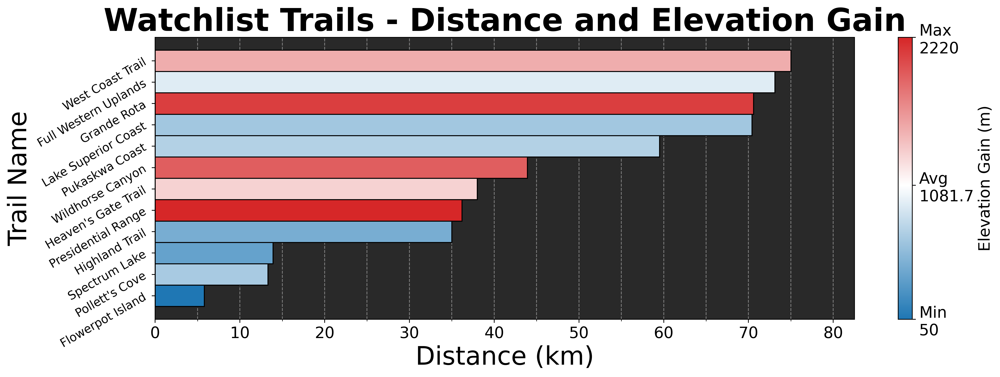

In [113]:
### Watchlist Trails - Distance and Elevation Gain

colorBarPlot(plotTitle = 'Watchlist Trails - Distance and Elevation Gain',
             xLabel = 'Distance (km)',
             trails = shortlistTrails,
             barUnits = 'km',
             barTop = 'distance',
             barTopLabel = 'distance',
             colorRange = hotColdColors,
             colorCol = 'elevation_gain',
             legendLocation = 'lower right',
             colorLabel = 'Elevation Gain (m)',
             savePlot = True)

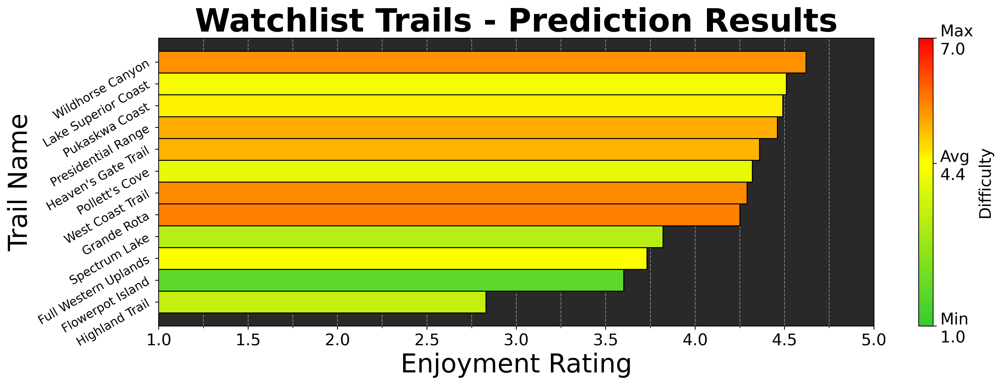

Exception ignored in: <function ResourceTracker.__del__ at 0x104a95bc0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x1034b5bc0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x10668dbc0>
Traceback (most recent call last

In [114]:
### Watchlist Trails - Prediction Results

colorBarPlot(plotTitle = 'Watchlist Trails - Prediction Results',
             xLabel = 'Enjoyment Rating',
             trails = shortlistTrails,
             barUnits = '/5.0',
             barUnitSpace = False,
             barTop = 'rating',
             barTopLabel = 'rating',
             colorRange = [difficultyColors[0], difficultyColors[1], difficultyColors[3]],
             colorMinMax = [1.0, 7.0],
             colorCol = 'difficulty',
             colorLabel = 'Difficulty',
             legendLocation = 'lower right',
             xBounds = [1,5],
             savePlot = True)